# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [10]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [11]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

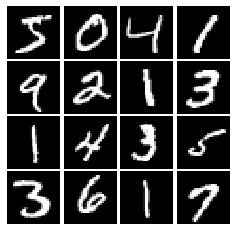

In [12]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [13]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.nn.leaky_relu(x, alpha)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [14]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [15]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [16]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [19]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [21]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [32]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh')
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [33]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [48]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)

    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [49]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [50]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [51]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [52]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 2.114, G:0.812


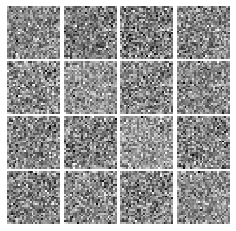

Epoch: 0, Iter: 20, D: 0.5876, G:0.9583


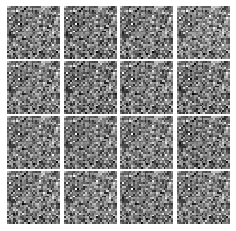

Epoch: 0, Iter: 40, D: 0.5398, G:1.057


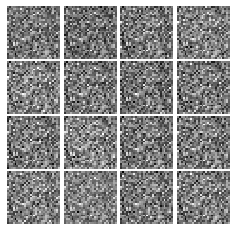

Epoch: 0, Iter: 60, D: 1.507, G:3.353


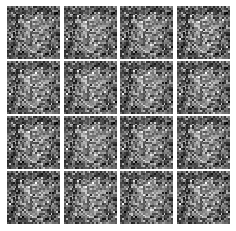

Epoch: 0, Iter: 80, D: 1.251, G:0.5295


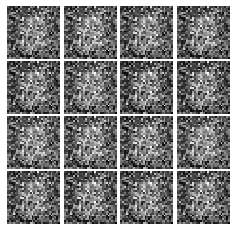

Epoch: 0, Iter: 100, D: 1.709, G:1.271


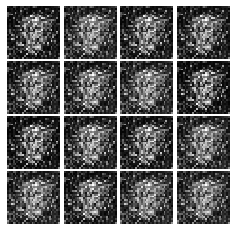

Epoch: 0, Iter: 120, D: 1.631, G:1.758


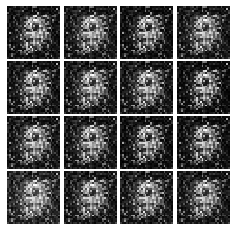

Epoch: 0, Iter: 140, D: 2.235, G:0.2856


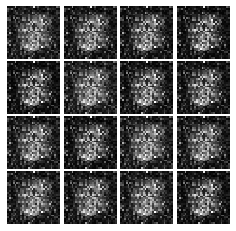

Epoch: 0, Iter: 160, D: 1.683, G:0.564


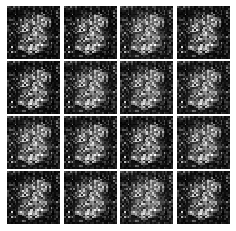

Epoch: 0, Iter: 180, D: 0.7395, G:1.729


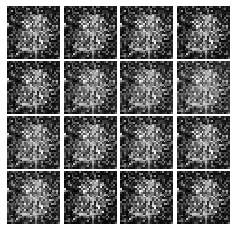

Epoch: 0, Iter: 200, D: 1.059, G:1.482


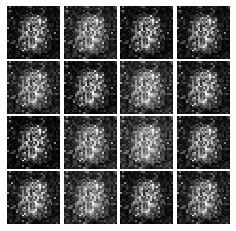

Epoch: 0, Iter: 220, D: 1.126, G:1.288


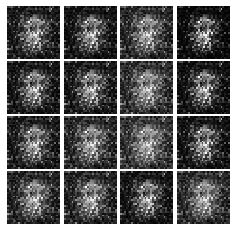

Epoch: 0, Iter: 240, D: 0.9896, G:1.183


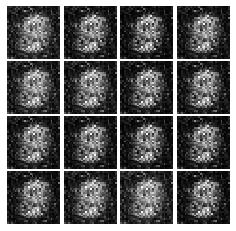

Epoch: 0, Iter: 260, D: 1.057, G:1.459


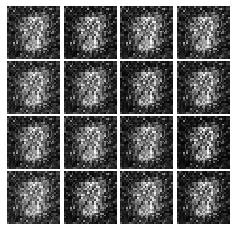

Epoch: 0, Iter: 280, D: 0.7622, G:1.953


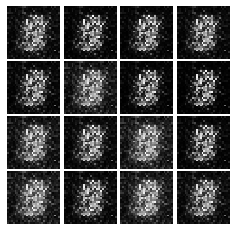

Epoch: 0, Iter: 300, D: 0.9222, G:1.463


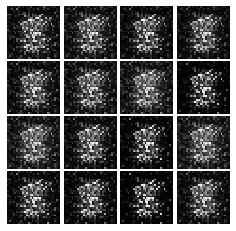

Epoch: 0, Iter: 320, D: 1.833, G:2.348


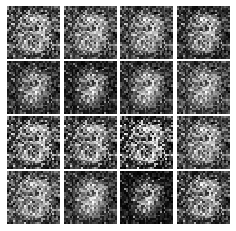

Epoch: 0, Iter: 340, D: 1.476, G:1.049


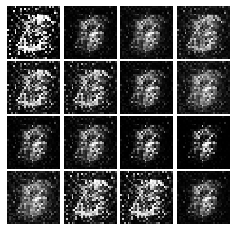

Epoch: 0, Iter: 360, D: 0.8978, G:1.829


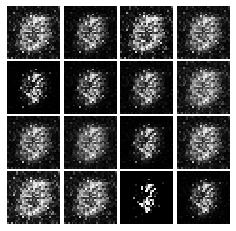

Epoch: 0, Iter: 380, D: 1.043, G:1.36


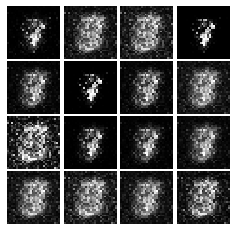

Epoch: 0, Iter: 400, D: 0.6795, G:1.873


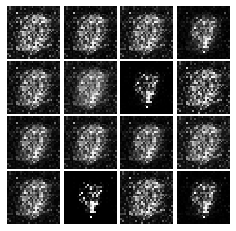

Epoch: 0, Iter: 420, D: 1.37, G:1.29


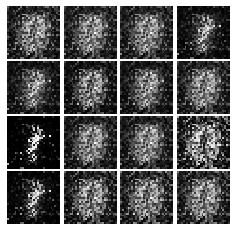

Epoch: 0, Iter: 440, D: 1.021, G:1.872


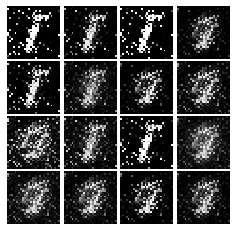

Epoch: 0, Iter: 460, D: 0.8193, G:3.041


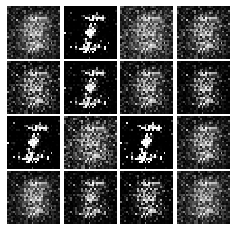

Epoch: 1, Iter: 480, D: 1.4, G:0.932


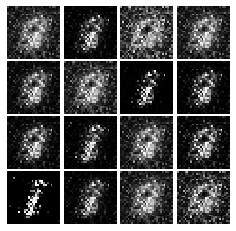

Epoch: 1, Iter: 500, D: 0.8839, G:1.719


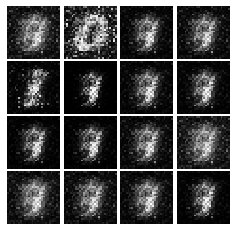

Epoch: 1, Iter: 520, D: 1.297, G:0.6461


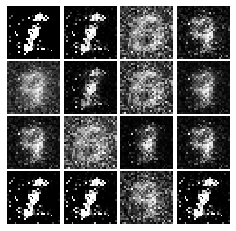

Epoch: 1, Iter: 540, D: 1.064, G:1.608


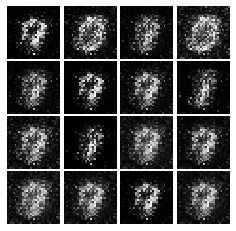

Epoch: 1, Iter: 560, D: 1.029, G:1.393


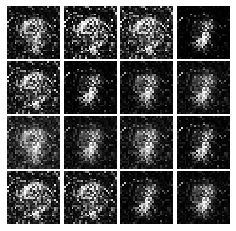

Epoch: 1, Iter: 580, D: 1.107, G:1.565


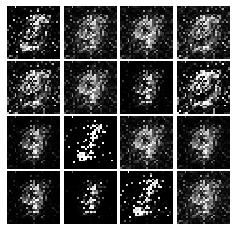

Epoch: 1, Iter: 600, D: 1.052, G:1.094


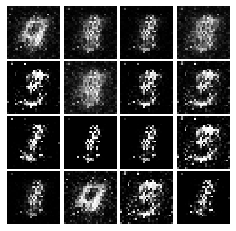

Epoch: 1, Iter: 620, D: 0.9685, G:2.054


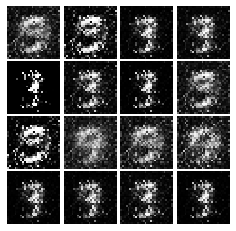

Epoch: 1, Iter: 640, D: 0.9963, G:1.89


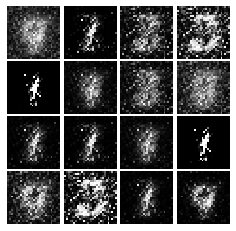

Epoch: 1, Iter: 660, D: 1.075, G:1.324


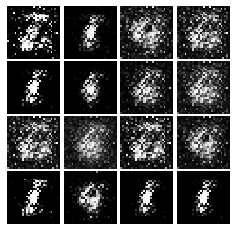

Epoch: 1, Iter: 680, D: 1.264, G:0.7844


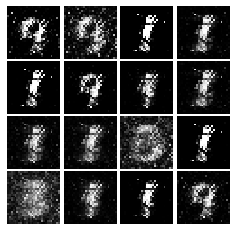

Epoch: 1, Iter: 700, D: 1.023, G:2.567


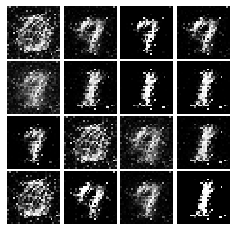

Epoch: 1, Iter: 720, D: 1.352, G:1.274


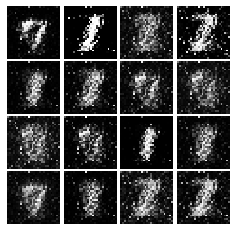

Epoch: 1, Iter: 740, D: 0.9994, G:1.558


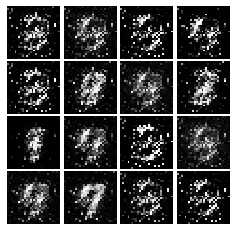

Epoch: 1, Iter: 760, D: 1.336, G:1.449


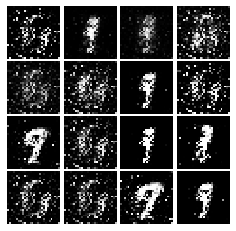

Epoch: 1, Iter: 780, D: 1.501, G:0.3426


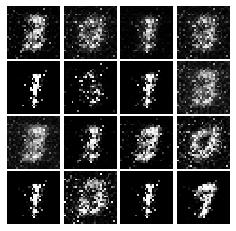

Epoch: 1, Iter: 800, D: 1.347, G:0.8845


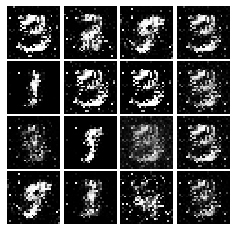

Epoch: 1, Iter: 820, D: 1.106, G:1.06


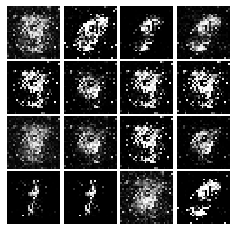

Epoch: 1, Iter: 840, D: 1.177, G:1.533


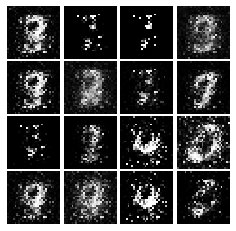

Epoch: 1, Iter: 860, D: 1.171, G:0.9224


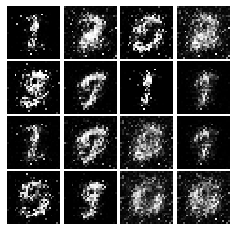

Epoch: 1, Iter: 880, D: 1.302, G:1.14


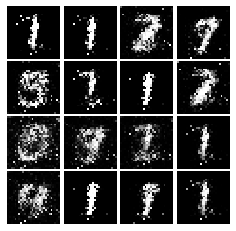

Epoch: 1, Iter: 900, D: 1.082, G:1.272


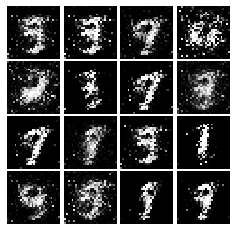

Epoch: 1, Iter: 920, D: 1.321, G:1.382


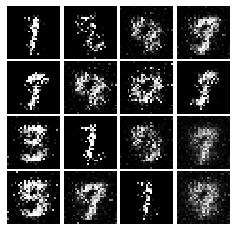

Epoch: 2, Iter: 940, D: 1.069, G:1.185


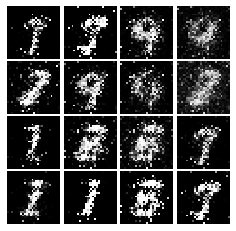

Epoch: 2, Iter: 960, D: 1.221, G:1.107


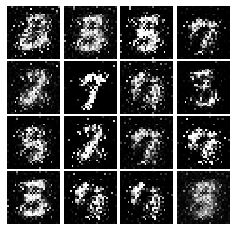

Epoch: 2, Iter: 980, D: 1.025, G:1.051


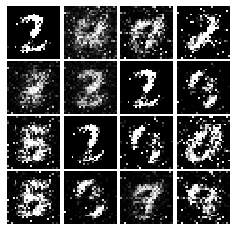

Epoch: 2, Iter: 1000, D: 1.161, G:1.512


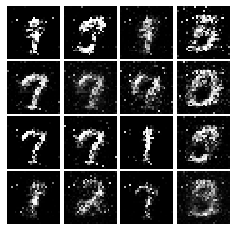

Epoch: 2, Iter: 1020, D: 1.096, G:2.376


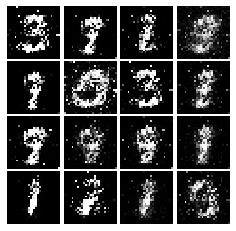

Epoch: 2, Iter: 1040, D: 1.2, G:1.707


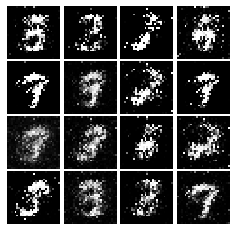

Epoch: 2, Iter: 1060, D: 1.345, G:1.599


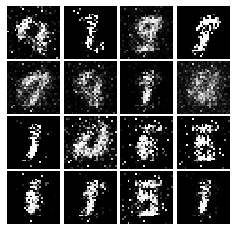

Epoch: 2, Iter: 1080, D: 0.9539, G:1.124


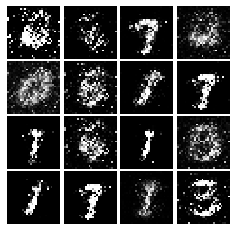

Epoch: 2, Iter: 1100, D: 0.955, G:2.32


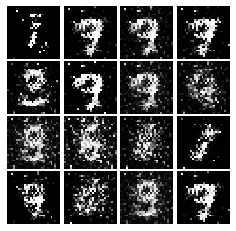

Epoch: 2, Iter: 1120, D: 1.066, G:1.494


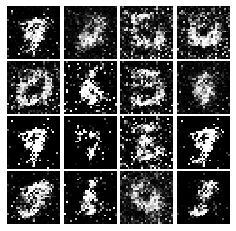

Epoch: 2, Iter: 1140, D: 2.807, G:0.5278


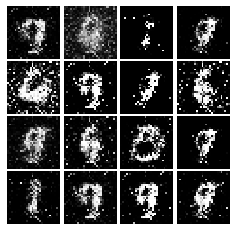

Epoch: 2, Iter: 1160, D: 1.462, G:0.9897


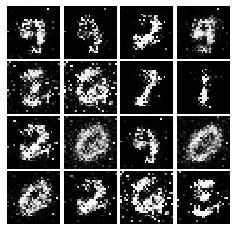

Epoch: 2, Iter: 1180, D: 0.9998, G:1.035


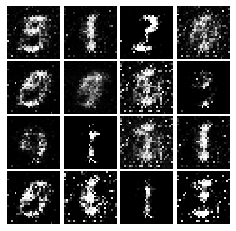

Epoch: 2, Iter: 1200, D: 1.184, G:1.113


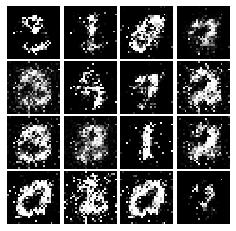

Epoch: 2, Iter: 1220, D: 1.108, G:1.685


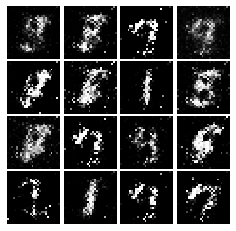

Epoch: 2, Iter: 1240, D: 1.019, G:2.334


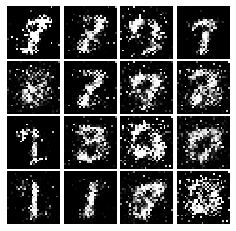

Epoch: 2, Iter: 1260, D: 1.393, G:0.8356


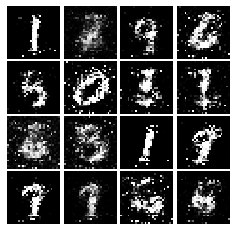

Epoch: 2, Iter: 1280, D: 1.212, G:1.104


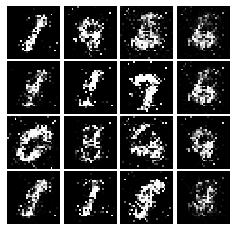

Epoch: 2, Iter: 1300, D: 1.232, G:1.173


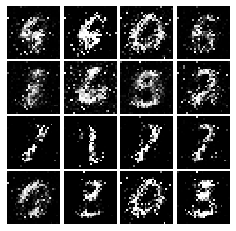

Epoch: 2, Iter: 1320, D: 1.193, G:1.067


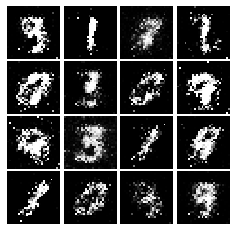

Epoch: 2, Iter: 1340, D: 1.401, G:0.9556


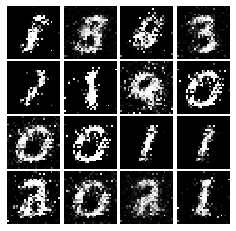

Epoch: 2, Iter: 1360, D: 1.322, G:1.132


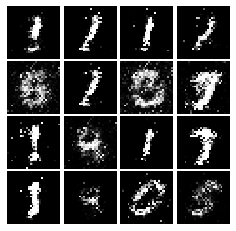

Epoch: 2, Iter: 1380, D: 1.272, G:1.207


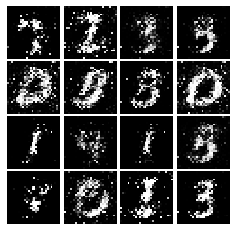

Epoch: 2, Iter: 1400, D: 1.018, G:1.013


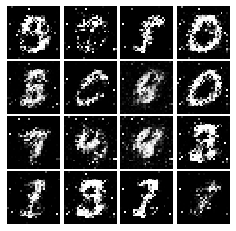

Epoch: 3, Iter: 1420, D: 1.171, G:0.8909


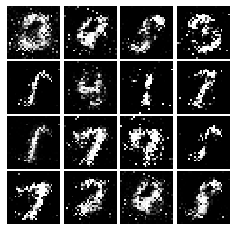

Epoch: 3, Iter: 1440, D: 1.352, G:1.117


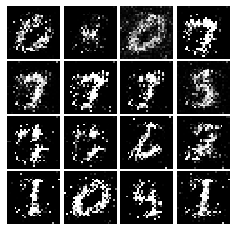

Epoch: 3, Iter: 1460, D: 1.26, G:0.9763


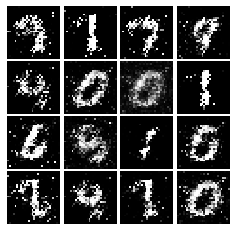

Epoch: 3, Iter: 1480, D: 1.249, G:1.308


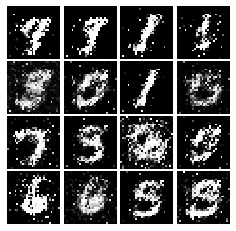

Epoch: 3, Iter: 1500, D: 0.9382, G:1.306


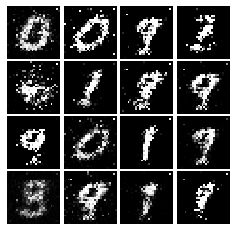

Epoch: 3, Iter: 1520, D: 1.303, G:1.264


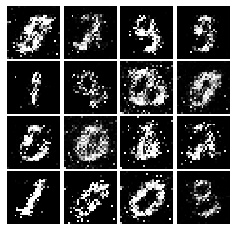

Epoch: 3, Iter: 1540, D: 1.129, G:1.394


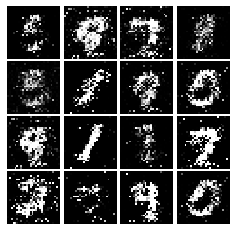

Epoch: 3, Iter: 1560, D: 1.155, G:1.109


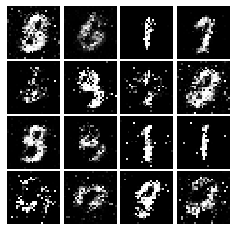

Epoch: 3, Iter: 1580, D: 1.382, G:0.9307


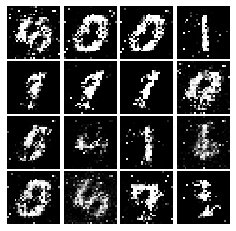

Epoch: 3, Iter: 1600, D: 1.18, G:1.052


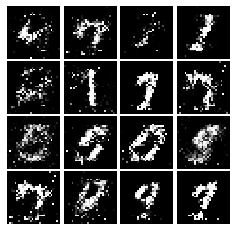

Epoch: 3, Iter: 1620, D: 1.164, G:1.07


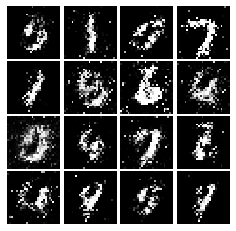

Epoch: 3, Iter: 1640, D: 1.477, G:0.9816


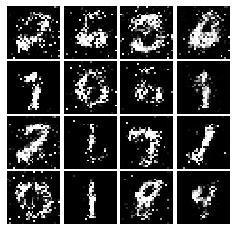

Epoch: 3, Iter: 1660, D: 1.11, G:1.148


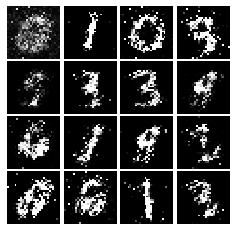

Epoch: 3, Iter: 1680, D: 1.307, G:1.12


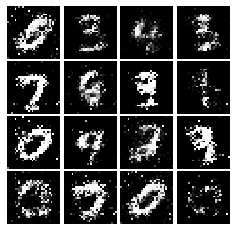

Epoch: 3, Iter: 1700, D: 1.377, G:1.04


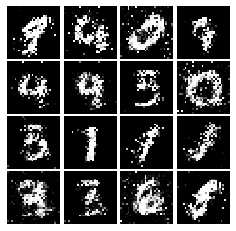

Epoch: 3, Iter: 1720, D: 1.255, G:1.033


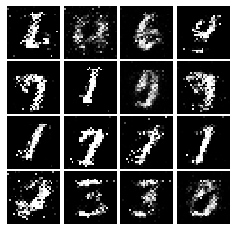

Epoch: 3, Iter: 1740, D: 1.29, G:1.036


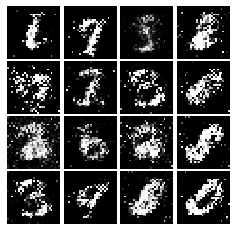

Epoch: 3, Iter: 1760, D: 1.155, G:1.139


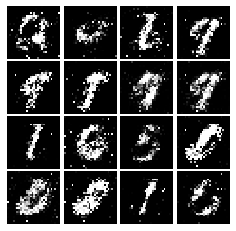

Epoch: 3, Iter: 1780, D: 1.246, G:0.8622


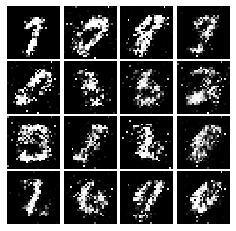

Epoch: 3, Iter: 1800, D: 1.487, G:0.9771


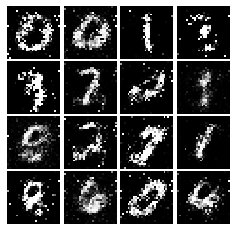

Epoch: 3, Iter: 1820, D: 1.271, G:0.8815


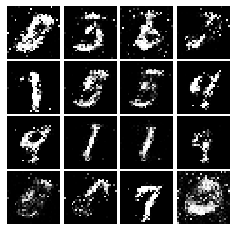

Epoch: 3, Iter: 1840, D: 1.279, G:0.8551


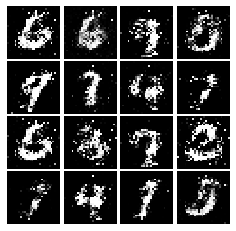

Epoch: 3, Iter: 1860, D: 1.542, G:1.88


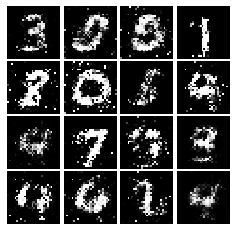

Epoch: 4, Iter: 1880, D: 1.31, G:0.9342


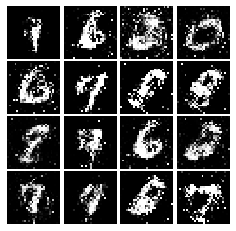

Epoch: 4, Iter: 1900, D: 1.249, G:0.9213


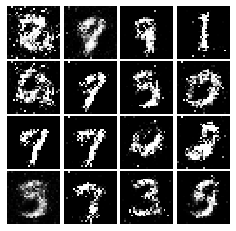

Epoch: 4, Iter: 1920, D: 1.214, G:0.9426


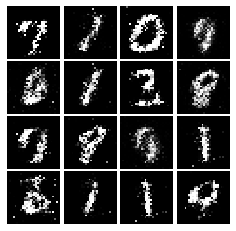

Epoch: 4, Iter: 1940, D: 1.387, G:0.8888


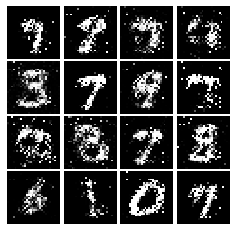

Epoch: 4, Iter: 1960, D: 1.36, G:0.8422


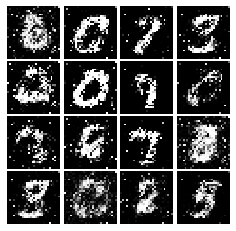

Epoch: 4, Iter: 1980, D: 1.31, G:0.8359


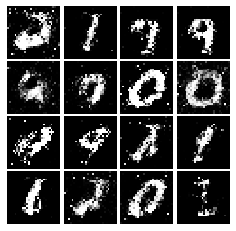

Epoch: 4, Iter: 2000, D: 1.424, G:0.8158


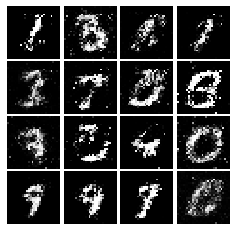

Epoch: 4, Iter: 2020, D: 1.298, G:0.8224


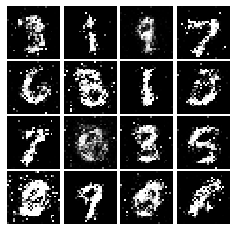

Epoch: 4, Iter: 2040, D: 1.372, G:0.8266


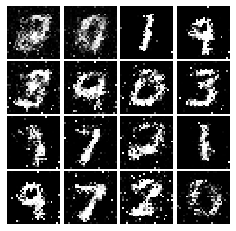

Epoch: 4, Iter: 2060, D: 1.208, G:0.9029


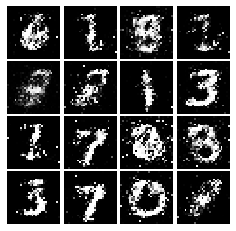

Epoch: 4, Iter: 2080, D: 1.361, G:0.8709


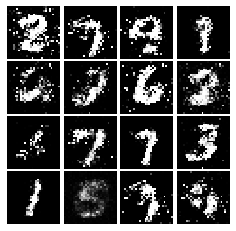

Epoch: 4, Iter: 2100, D: 1.332, G:0.8126


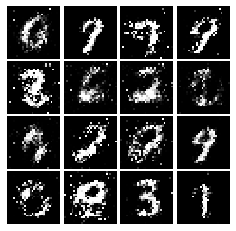

Epoch: 4, Iter: 2120, D: 1.43, G:0.7865


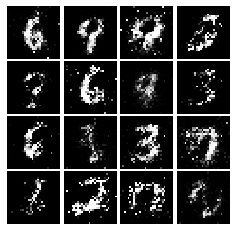

Epoch: 4, Iter: 2140, D: 1.343, G:0.8482


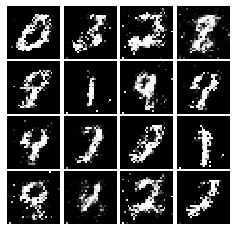

Epoch: 4, Iter: 2160, D: 1.412, G:0.8828


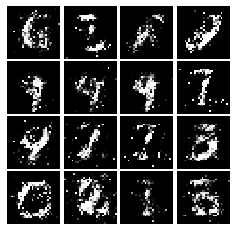

Epoch: 4, Iter: 2180, D: 1.321, G:0.7276


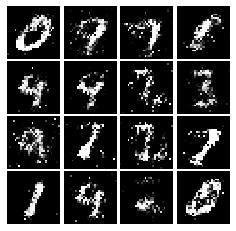

Epoch: 4, Iter: 2200, D: 1.164, G:1.171


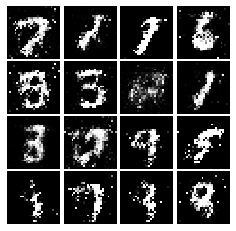

Epoch: 4, Iter: 2220, D: 1.184, G:1.491


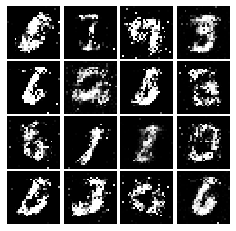

Epoch: 4, Iter: 2240, D: 1.277, G:0.7536


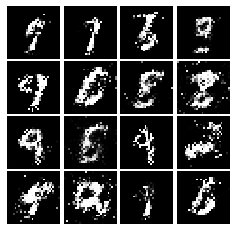

Epoch: 4, Iter: 2260, D: 1.224, G:0.9287


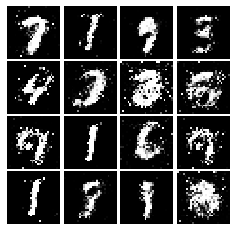

Epoch: 4, Iter: 2280, D: 1.308, G:1.047


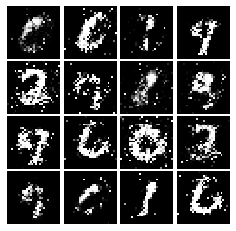

Epoch: 4, Iter: 2300, D: 1.323, G:0.8081


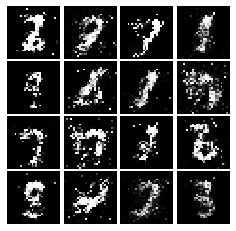

Epoch: 4, Iter: 2320, D: 1.206, G:1.056


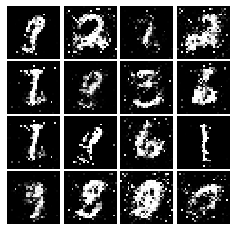

Epoch: 4, Iter: 2340, D: 1.159, G:1.147


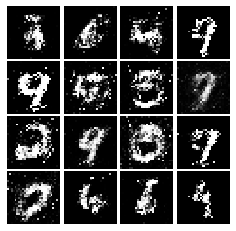

Epoch: 5, Iter: 2360, D: 1.18, G:1.411


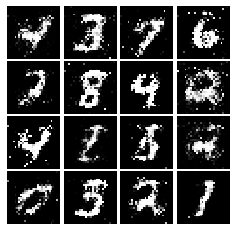

Epoch: 5, Iter: 2380, D: 1.302, G:0.8924


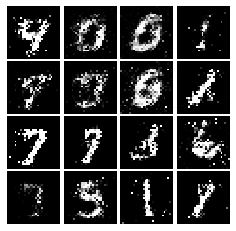

Epoch: 5, Iter: 2400, D: 1.208, G:0.8305


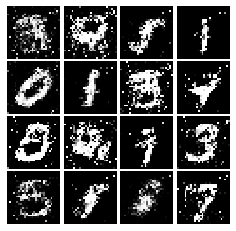

Epoch: 5, Iter: 2420, D: 1.344, G:0.8534


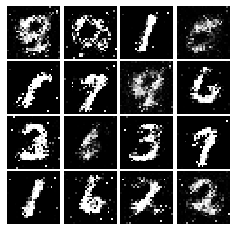

Epoch: 5, Iter: 2440, D: 1.294, G:0.7948


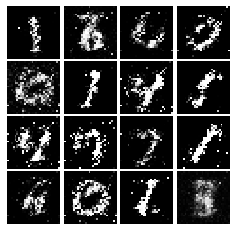

Epoch: 5, Iter: 2460, D: 1.498, G:0.6145


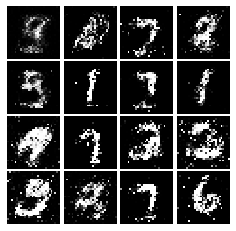

Epoch: 5, Iter: 2480, D: 1.24, G:0.8648


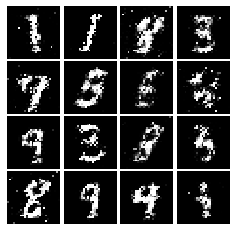

Epoch: 5, Iter: 2500, D: 1.294, G:0.8308


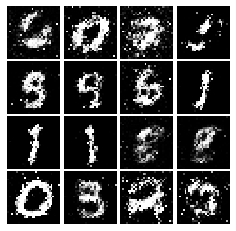

Epoch: 5, Iter: 2520, D: 1.369, G:0.873


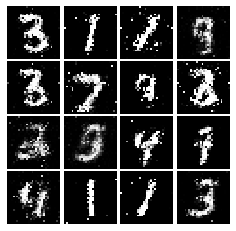

Epoch: 5, Iter: 2540, D: 1.293, G:0.844


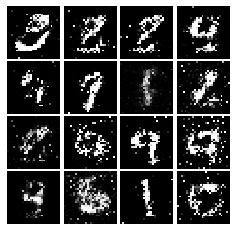

Epoch: 5, Iter: 2560, D: 1.351, G:0.869


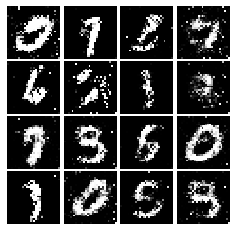

Epoch: 5, Iter: 2580, D: 1.324, G:0.8436


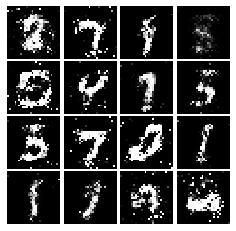

Epoch: 5, Iter: 2600, D: 1.465, G:0.8444


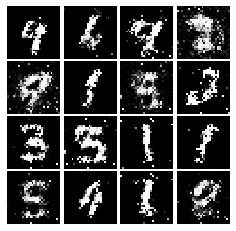

Epoch: 5, Iter: 2620, D: 1.304, G:0.906


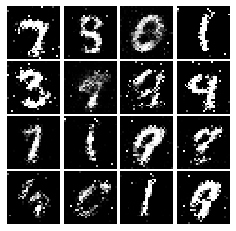

Epoch: 5, Iter: 2640, D: 1.27, G:0.8111


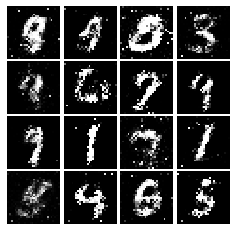

Epoch: 5, Iter: 2660, D: 1.29, G:0.8567


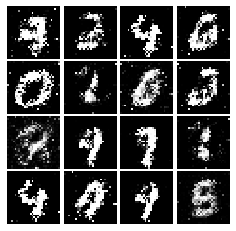

Epoch: 5, Iter: 2680, D: 1.335, G:0.8264


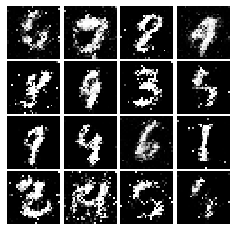

Epoch: 5, Iter: 2700, D: 1.278, G:0.8642


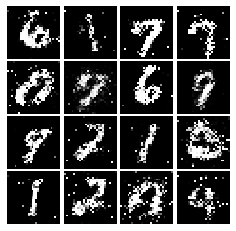

Epoch: 5, Iter: 2720, D: 1.301, G:0.8064


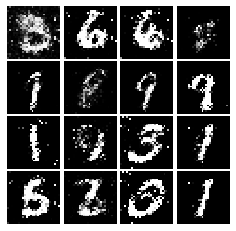

Epoch: 5, Iter: 2740, D: 1.368, G:0.8794


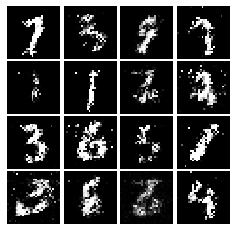

Epoch: 5, Iter: 2760, D: 1.322, G:0.8857


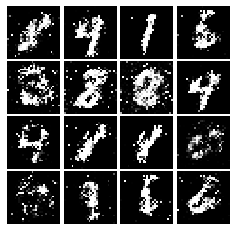

Epoch: 5, Iter: 2780, D: 1.201, G:0.7802


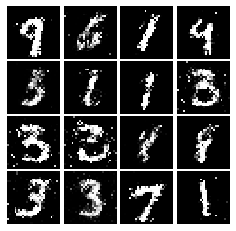

Epoch: 5, Iter: 2800, D: 1.297, G:0.9962


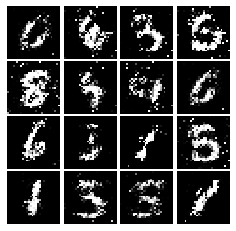

Epoch: 6, Iter: 2820, D: 1.291, G:0.7692


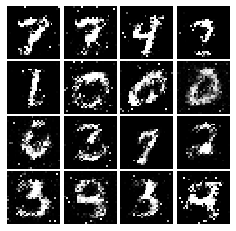

Epoch: 6, Iter: 2840, D: 1.265, G:0.9001


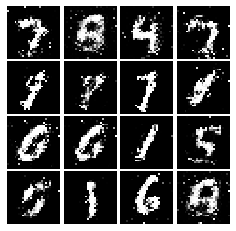

Epoch: 6, Iter: 2860, D: 1.405, G:0.6659


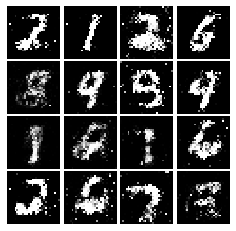

Epoch: 6, Iter: 2880, D: 1.321, G:0.7892


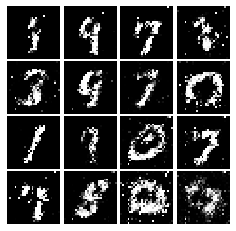

Epoch: 6, Iter: 2900, D: 1.247, G:0.8291


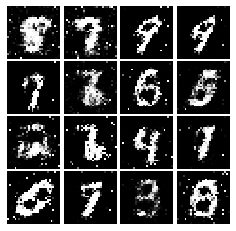

Epoch: 6, Iter: 2920, D: 1.344, G:0.8867


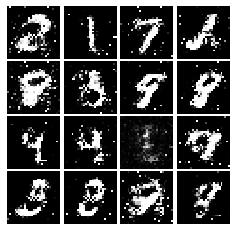

Epoch: 6, Iter: 2940, D: 1.349, G:0.9775


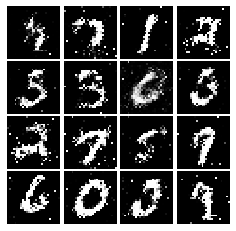

Epoch: 6, Iter: 2960, D: 1.37, G:1.16


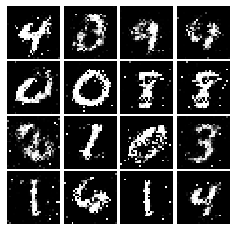

Epoch: 6, Iter: 2980, D: 1.356, G:0.8093


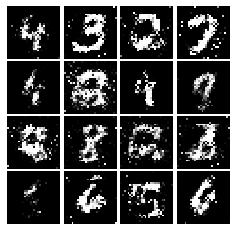

Epoch: 6, Iter: 3000, D: 1.34, G:0.9451


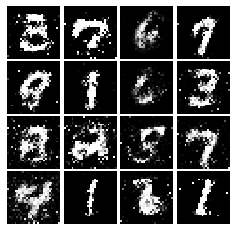

Epoch: 6, Iter: 3020, D: 1.378, G:0.8361


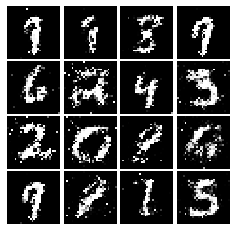

Epoch: 6, Iter: 3040, D: 1.307, G:0.8752


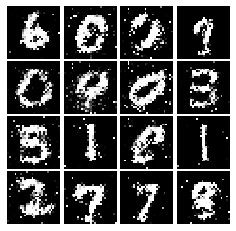

Epoch: 6, Iter: 3060, D: 1.354, G:0.7973


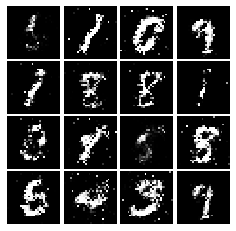

Epoch: 6, Iter: 3080, D: 1.398, G:0.8459


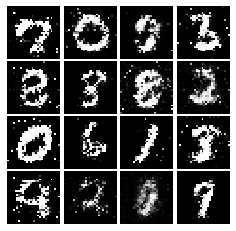

Epoch: 6, Iter: 3100, D: 1.171, G:0.897


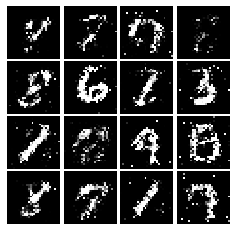

Epoch: 6, Iter: 3120, D: 1.295, G:0.7521


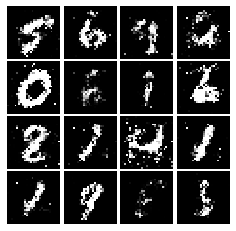

Epoch: 6, Iter: 3140, D: 1.371, G:0.8933


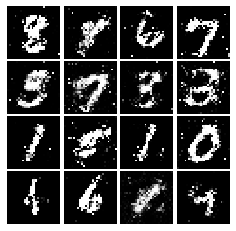

Epoch: 6, Iter: 3160, D: 1.287, G:0.899


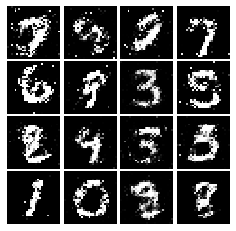

Epoch: 6, Iter: 3180, D: 1.279, G:0.8575


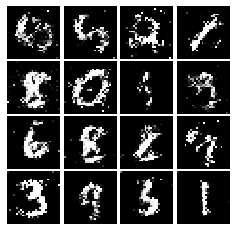

Epoch: 6, Iter: 3200, D: 1.275, G:1.133


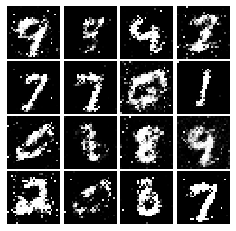

Epoch: 6, Iter: 3220, D: 1.233, G:0.8424


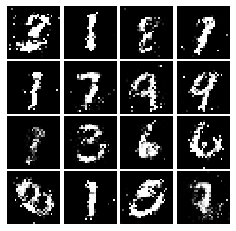

Epoch: 6, Iter: 3240, D: 1.211, G:0.8944


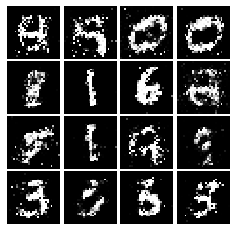

Epoch: 6, Iter: 3260, D: 1.413, G:0.812


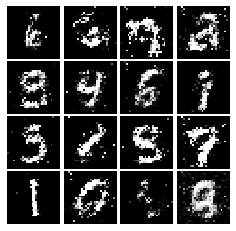

Epoch: 6, Iter: 3280, D: 1.402, G:0.919


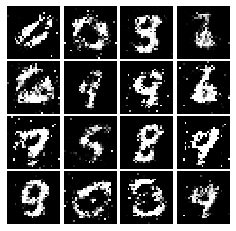

Epoch: 7, Iter: 3300, D: 1.28, G:0.8072


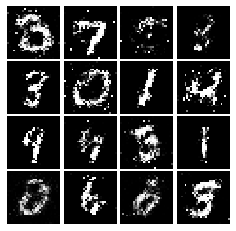

Epoch: 7, Iter: 3320, D: 1.455, G:0.8161


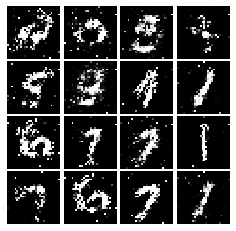

Epoch: 7, Iter: 3340, D: 1.253, G:0.8883


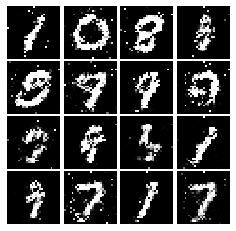

Epoch: 7, Iter: 3360, D: 1.329, G:0.9568


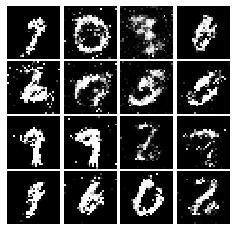

Epoch: 7, Iter: 3380, D: 1.344, G:0.9055


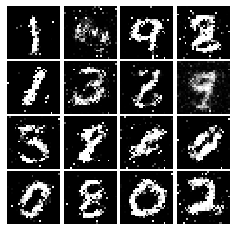

Epoch: 7, Iter: 3400, D: 1.4, G:0.81


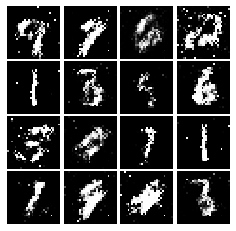

Epoch: 7, Iter: 3420, D: 1.342, G:0.8192


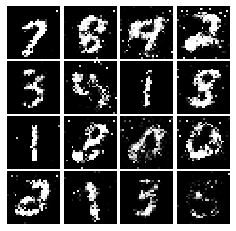

Epoch: 7, Iter: 3440, D: 1.29, G:1.0


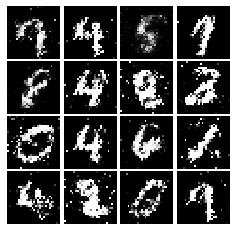

Epoch: 7, Iter: 3460, D: 1.342, G:0.7805


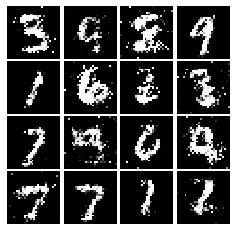

Epoch: 7, Iter: 3480, D: 1.399, G:0.7923


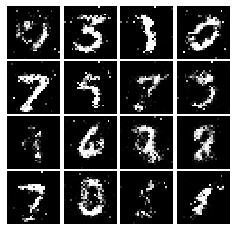

Epoch: 7, Iter: 3500, D: 1.278, G:0.8208


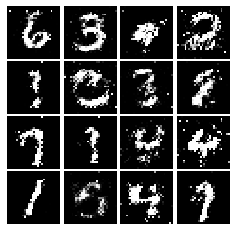

Epoch: 7, Iter: 3520, D: 1.31, G:0.8119


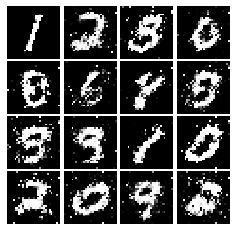

Epoch: 7, Iter: 3540, D: 1.244, G:0.7927


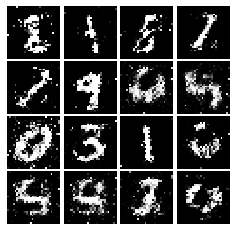

Epoch: 7, Iter: 3560, D: 1.369, G:0.7459


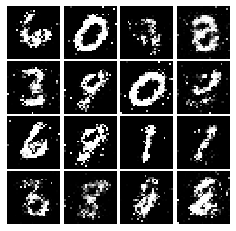

Epoch: 7, Iter: 3580, D: 1.383, G:0.8297


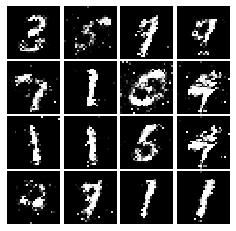

Epoch: 7, Iter: 3600, D: 1.303, G:0.7545


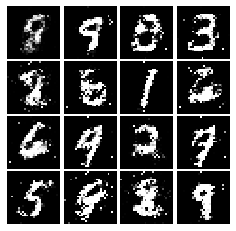

Epoch: 7, Iter: 3620, D: 1.354, G:0.8765


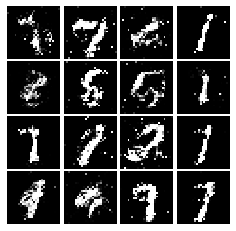

Epoch: 7, Iter: 3640, D: 1.321, G:0.8517


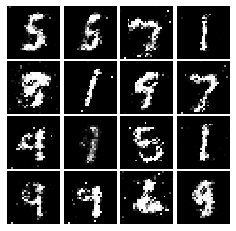

Epoch: 7, Iter: 3660, D: 1.271, G:0.9224


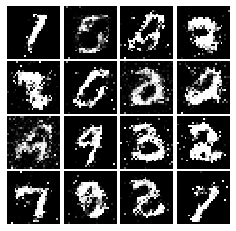

Epoch: 7, Iter: 3680, D: 1.302, G:0.7536


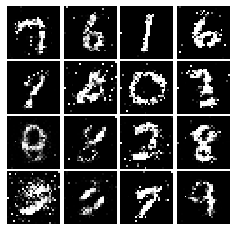

Epoch: 7, Iter: 3700, D: 1.255, G:0.8512


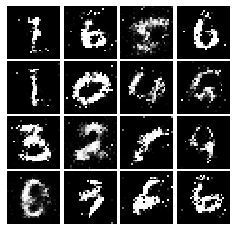

Epoch: 7, Iter: 3720, D: 1.336, G:0.8109


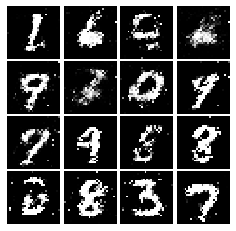

Epoch: 7, Iter: 3740, D: 1.313, G:0.8221


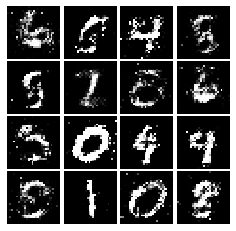

Epoch: 8, Iter: 3760, D: 1.374, G:0.7827


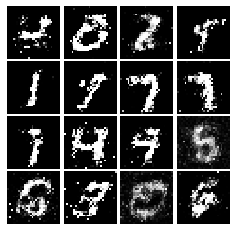

Epoch: 8, Iter: 3780, D: 1.288, G:0.8146


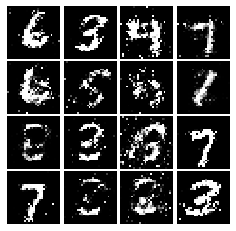

Epoch: 8, Iter: 3800, D: 1.331, G:0.7758


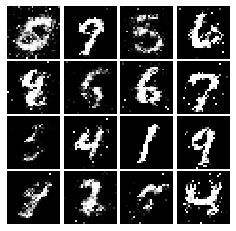

Epoch: 8, Iter: 3820, D: 1.417, G:0.8255


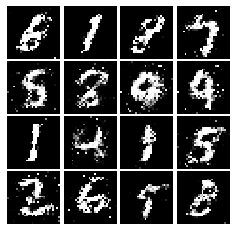

Epoch: 8, Iter: 3840, D: 1.312, G:0.8271


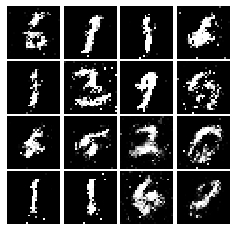

Epoch: 8, Iter: 3860, D: 1.357, G:0.7394


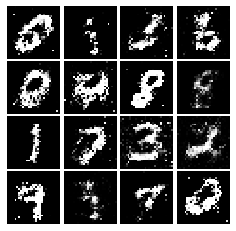

Epoch: 8, Iter: 3880, D: 1.219, G:0.9087


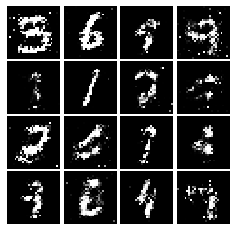

Epoch: 8, Iter: 3900, D: 1.332, G:0.9


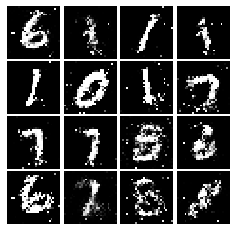

Epoch: 8, Iter: 3920, D: 1.201, G:1.027


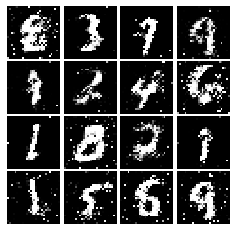

Epoch: 8, Iter: 3940, D: 1.32, G:0.9342


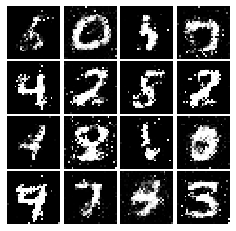

Epoch: 8, Iter: 3960, D: 1.319, G:0.771


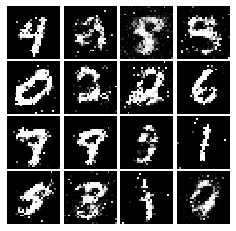

Epoch: 8, Iter: 3980, D: 1.449, G:0.8507


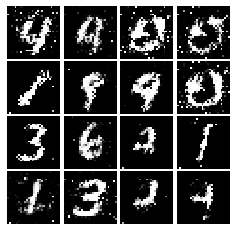

Epoch: 8, Iter: 4000, D: 1.354, G:0.8264


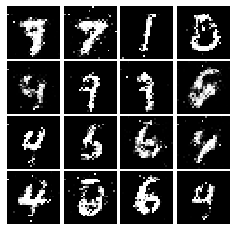

Epoch: 8, Iter: 4020, D: 1.334, G:0.681


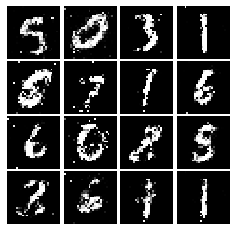

Epoch: 8, Iter: 4040, D: 1.334, G:0.8349


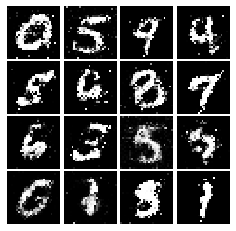

Epoch: 8, Iter: 4060, D: 1.252, G:0.8579


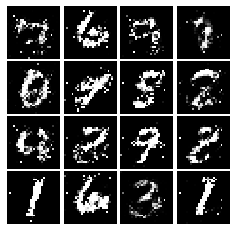

Epoch: 8, Iter: 4080, D: 1.379, G:0.7623


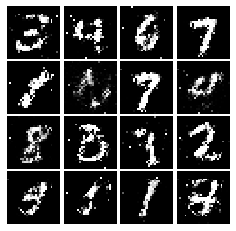

Epoch: 8, Iter: 4100, D: 1.318, G:0.7845


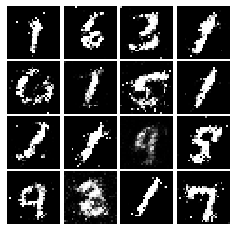

Epoch: 8, Iter: 4120, D: 1.326, G:0.7694


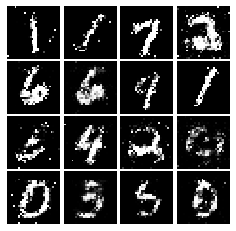

Epoch: 8, Iter: 4140, D: 1.289, G:0.9401


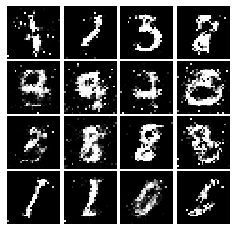

Epoch: 8, Iter: 4160, D: 1.342, G:0.8158


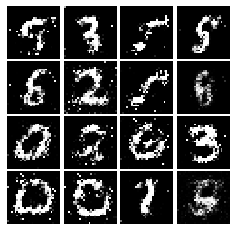

Epoch: 8, Iter: 4180, D: 1.314, G:0.7695


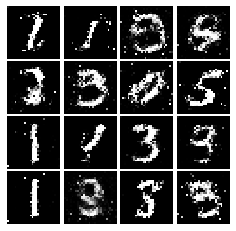

Epoch: 8, Iter: 4200, D: 1.355, G:0.8176


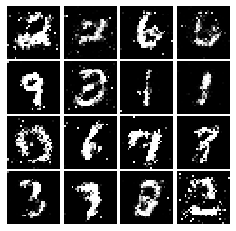

Epoch: 8, Iter: 4220, D: 1.441, G:0.8064


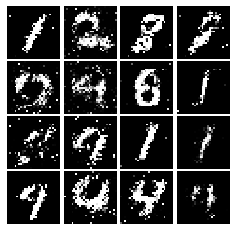

Epoch: 9, Iter: 4240, D: 1.376, G:0.766


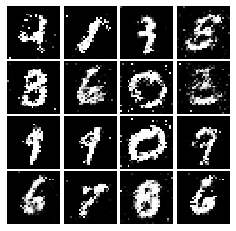

Epoch: 9, Iter: 4260, D: 1.369, G:0.7544


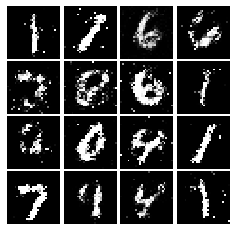

Epoch: 9, Iter: 4280, D: 1.371, G:0.7323


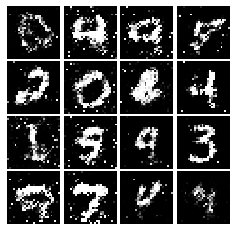

Epoch: 9, Iter: 4300, D: 1.356, G:0.787


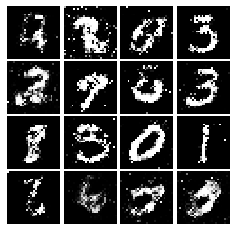

Epoch: 9, Iter: 4320, D: 1.392, G:0.7911


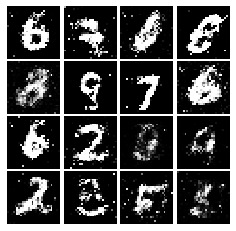

Epoch: 9, Iter: 4340, D: 1.312, G:0.8542


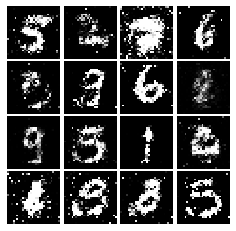

Epoch: 9, Iter: 4360, D: 1.382, G:0.7704


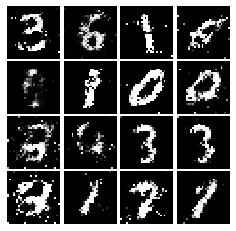

Epoch: 9, Iter: 4380, D: 1.452, G:0.8437


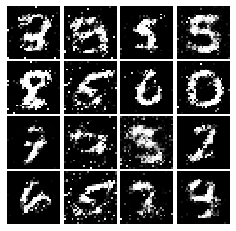

Epoch: 9, Iter: 4400, D: 1.275, G:0.7826


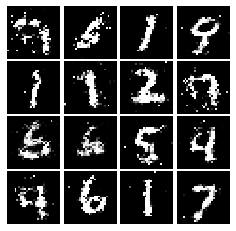

Epoch: 9, Iter: 4420, D: 1.329, G:0.7166


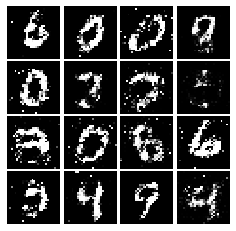

Epoch: 9, Iter: 4440, D: 1.41, G:0.7444


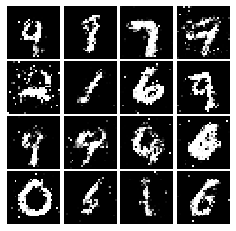

Epoch: 9, Iter: 4460, D: 1.313, G:0.7479


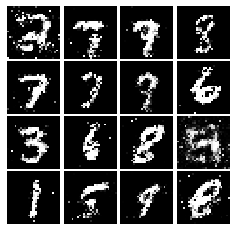

Epoch: 9, Iter: 4480, D: 1.368, G:0.763


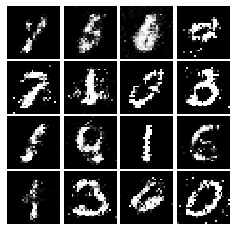

Epoch: 9, Iter: 4500, D: 1.386, G:0.8119


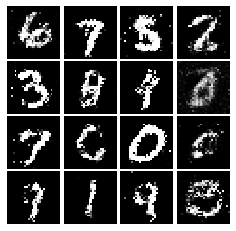

Epoch: 9, Iter: 4520, D: 1.299, G:0.9412


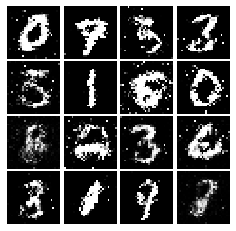

Epoch: 9, Iter: 4540, D: 1.368, G:0.7562


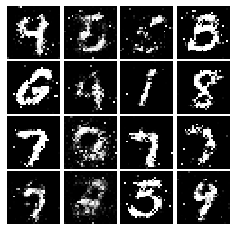

Epoch: 9, Iter: 4560, D: 1.371, G:0.7659


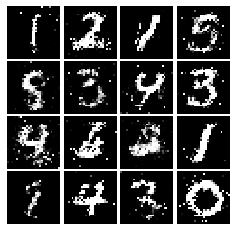

Epoch: 9, Iter: 4580, D: 1.381, G:0.7826


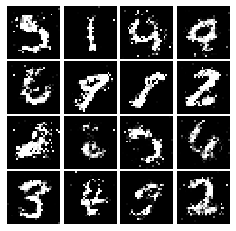

Epoch: 9, Iter: 4600, D: 1.359, G:0.7912


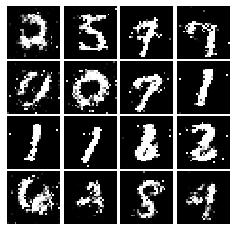

Epoch: 9, Iter: 4620, D: 1.371, G:0.812


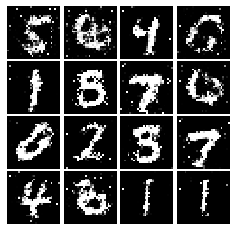

Epoch: 9, Iter: 4640, D: 1.337, G:0.8323


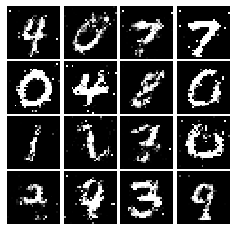

Epoch: 9, Iter: 4660, D: 1.403, G:0.7506


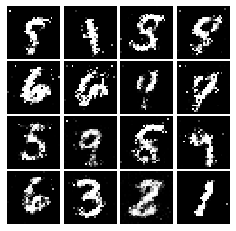

Epoch: 9, Iter: 4680, D: 1.31, G:0.7748


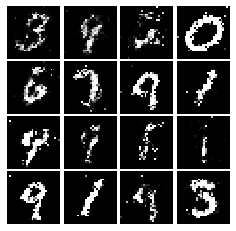

Final images


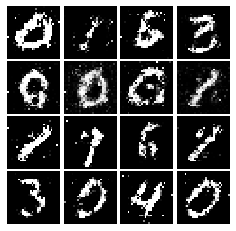

In [53]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [54]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [55]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.123, G:0.494


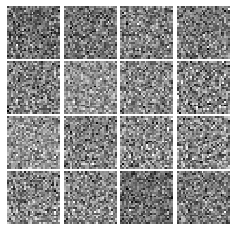

Epoch: 0, Iter: 20, D: 0.04578, G:0.7224


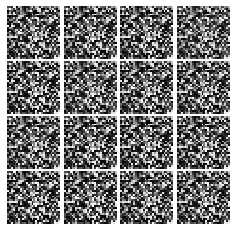

Epoch: 0, Iter: 40, D: 0.03576, G:0.893


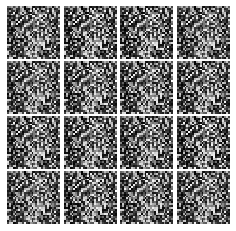

Epoch: 0, Iter: 60, D: 0.1328, G:0.5739


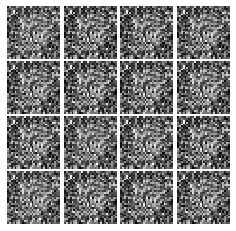

Epoch: 0, Iter: 80, D: 0.08233, G:0.4137


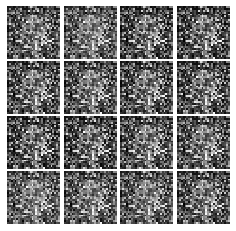

Epoch: 0, Iter: 100, D: 0.0256, G:1.058


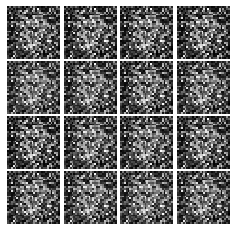

Epoch: 0, Iter: 120, D: 0.09199, G:0.245


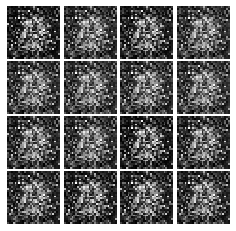

Epoch: 0, Iter: 140, D: 0.2928, G:1.956


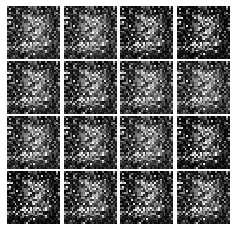

Epoch: 0, Iter: 160, D: 0.07561, G:0.6317


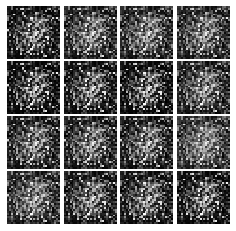

Epoch: 0, Iter: 180, D: 0.3825, G:0.1235


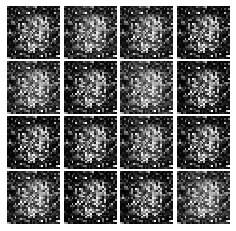

Epoch: 0, Iter: 200, D: 0.1158, G:0.83


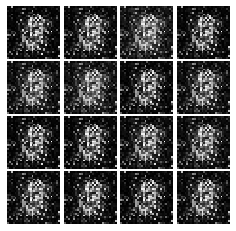

Epoch: 0, Iter: 220, D: 0.1324, G:0.7362


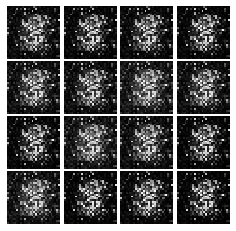

Epoch: 0, Iter: 240, D: 0.1624, G:0.199


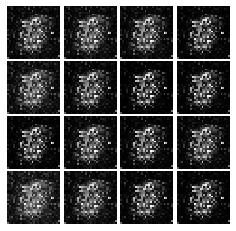

Epoch: 0, Iter: 260, D: 0.217, G:0.1917


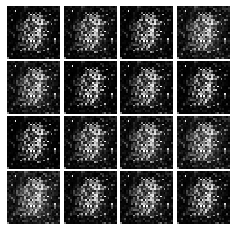

Epoch: 0, Iter: 280, D: 0.1194, G:0.4128


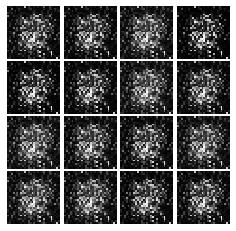

Epoch: 0, Iter: 300, D: 0.0499, G:0.4511


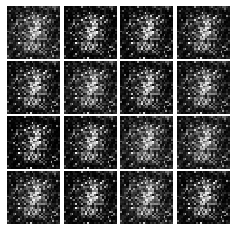

Epoch: 0, Iter: 320, D: 0.09626, G:0.4797


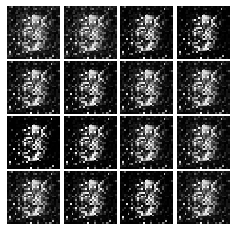

Epoch: 0, Iter: 340, D: 0.1564, G:0.2711


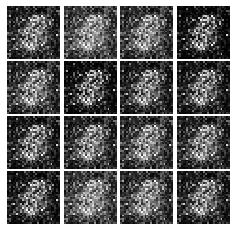

Epoch: 0, Iter: 360, D: 0.176, G:0.6303


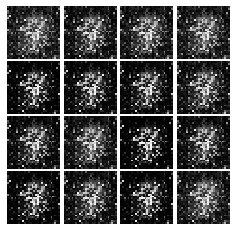

Epoch: 0, Iter: 380, D: 0.1065, G:0.8909


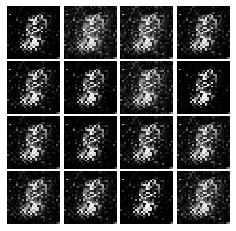

Epoch: 0, Iter: 400, D: 0.05573, G:0.4985


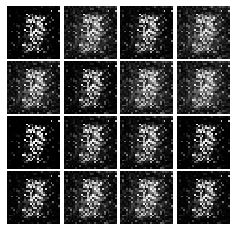

Epoch: 0, Iter: 420, D: 0.1903, G:0.5713


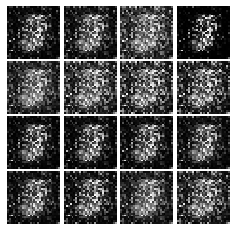

Epoch: 0, Iter: 440, D: 0.169, G:0.5074


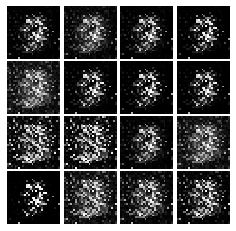

Epoch: 0, Iter: 460, D: 0.07564, G:0.4256


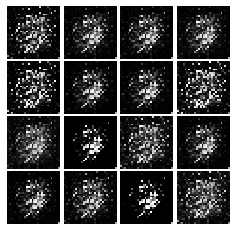

Epoch: 1, Iter: 480, D: 0.1602, G:0.4995


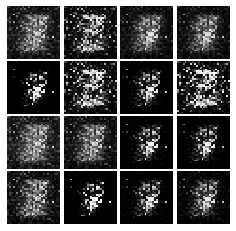

Epoch: 1, Iter: 500, D: 0.1458, G:0.403


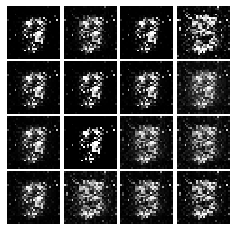

Epoch: 1, Iter: 520, D: 0.1414, G:0.4621


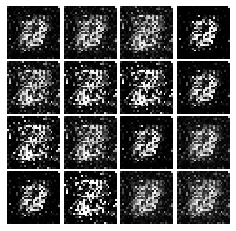

Epoch: 1, Iter: 540, D: 0.1111, G:0.461


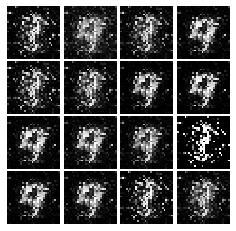

Epoch: 1, Iter: 560, D: 0.1224, G:0.2413


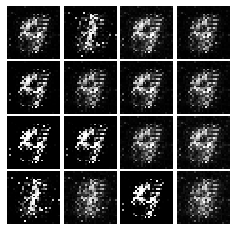

Epoch: 1, Iter: 580, D: 0.1263, G:0.316


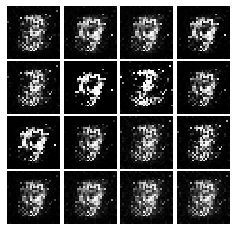

Epoch: 1, Iter: 600, D: 0.13, G:0.5012


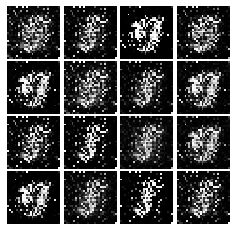

Epoch: 1, Iter: 620, D: 0.8027, G:0.5109


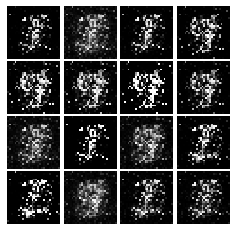

Epoch: 1, Iter: 640, D: 0.3065, G:1.113


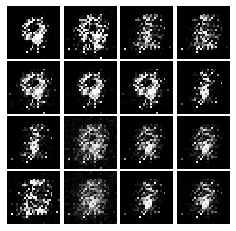

Epoch: 1, Iter: 660, D: 0.2795, G:0.4028


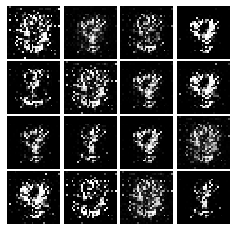

Epoch: 1, Iter: 680, D: 1.166, G:0.03215


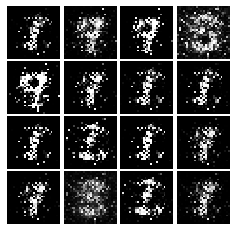

Epoch: 1, Iter: 700, D: 0.1343, G:0.3479


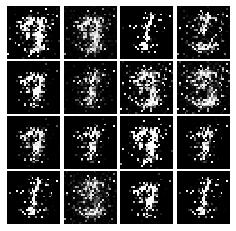

Epoch: 1, Iter: 720, D: 0.05357, G:0.5053


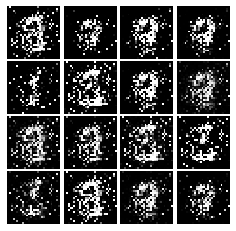

Epoch: 1, Iter: 740, D: 0.07392, G:0.3978


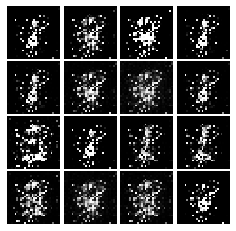

Epoch: 1, Iter: 760, D: 0.1192, G:0.4423


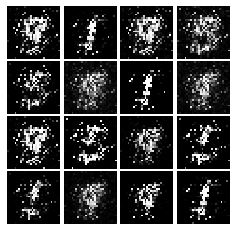

Epoch: 1, Iter: 780, D: 0.1611, G:0.4052


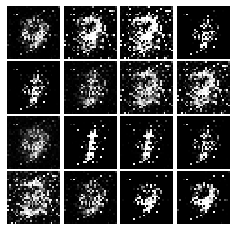

Epoch: 1, Iter: 800, D: 0.1666, G:0.2595


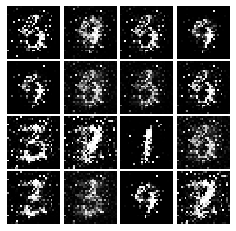

Epoch: 1, Iter: 820, D: 0.1103, G:0.5741


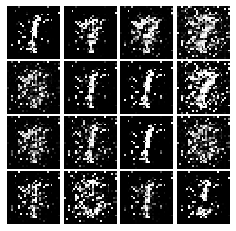

Epoch: 1, Iter: 840, D: 0.1213, G:0.3929


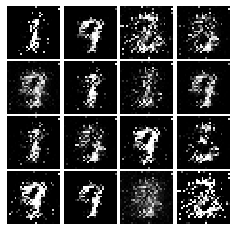

Epoch: 1, Iter: 860, D: 0.2179, G:0.02045


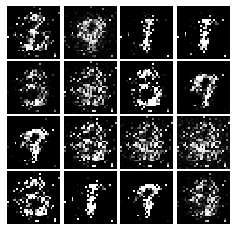

Epoch: 1, Iter: 880, D: 0.1433, G:1.095


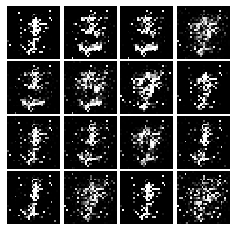

Epoch: 1, Iter: 900, D: 0.1429, G:0.4365


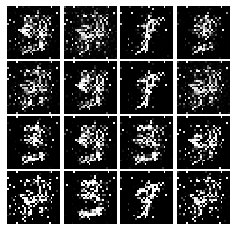

Epoch: 1, Iter: 920, D: 0.1624, G:0.2637


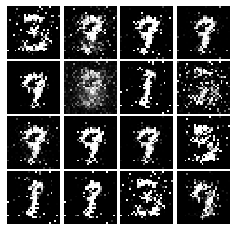

Epoch: 2, Iter: 940, D: 0.2566, G:0.1504


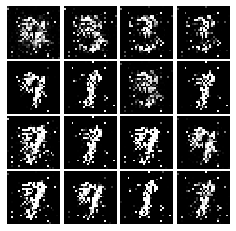

Epoch: 2, Iter: 960, D: 0.2304, G:0.2638


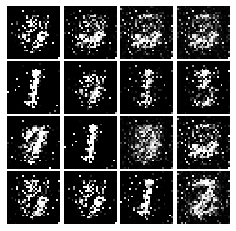

Epoch: 2, Iter: 980, D: 0.1314, G:0.3416


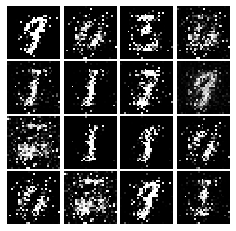

Epoch: 2, Iter: 1000, D: 0.09781, G:0.3257


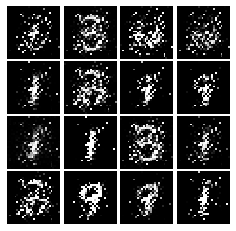

Epoch: 2, Iter: 1020, D: 0.08785, G:0.3626


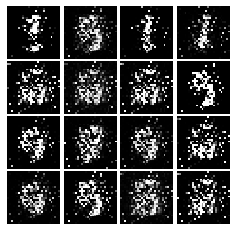

Epoch: 2, Iter: 1040, D: 0.04043, G:0.5578


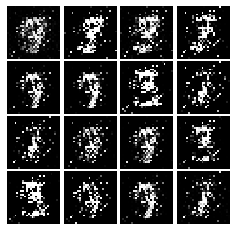

Epoch: 2, Iter: 1060, D: 0.1872, G:0.4074


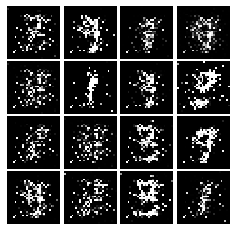

Epoch: 2, Iter: 1080, D: 0.3761, G:0.342


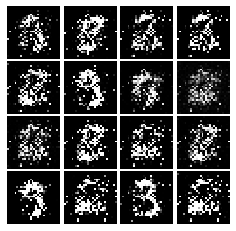

Epoch: 2, Iter: 1100, D: 0.2039, G:0.3783


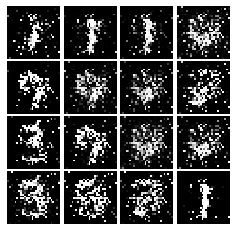

Epoch: 2, Iter: 1120, D: 0.1143, G:0.3334


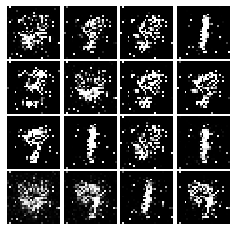

Epoch: 2, Iter: 1140, D: 0.1521, G:0.2925


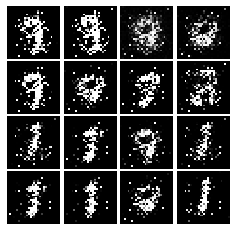

Epoch: 2, Iter: 1160, D: 0.1196, G:0.3815


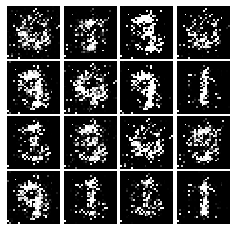

Epoch: 2, Iter: 1180, D: 0.1408, G:0.4091


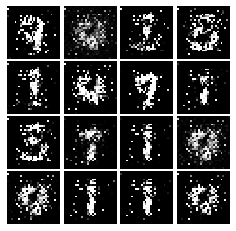

Epoch: 2, Iter: 1200, D: 0.1785, G:0.2721


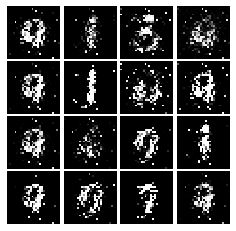

Epoch: 2, Iter: 1220, D: 0.5772, G:0.217


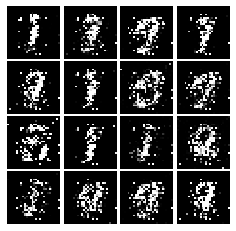

Epoch: 2, Iter: 1240, D: 0.1987, G:0.4075


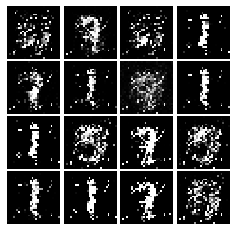

Epoch: 2, Iter: 1260, D: 0.1248, G:0.2887


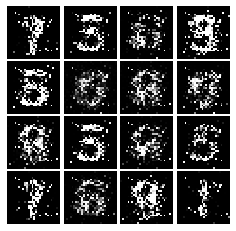

Epoch: 2, Iter: 1280, D: 0.07491, G:0.4521


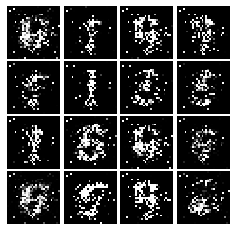

Epoch: 2, Iter: 1300, D: 0.07287, G:0.404


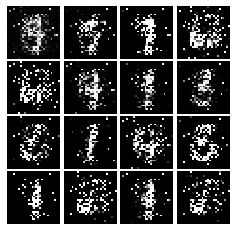

Epoch: 2, Iter: 1320, D: 0.1225, G:0.2684


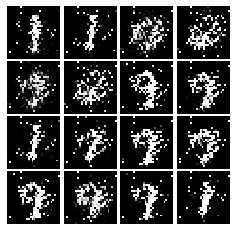

Epoch: 2, Iter: 1340, D: 0.3821, G:0.4458


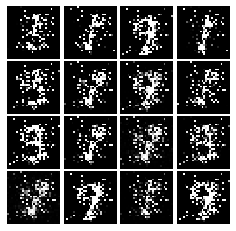

Epoch: 2, Iter: 1360, D: 0.4471, G:2.523


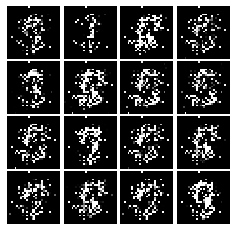

Epoch: 2, Iter: 1380, D: 0.1557, G:0.2376


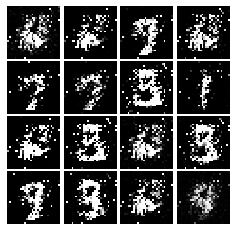

Epoch: 2, Iter: 1400, D: 0.1163, G:0.2685


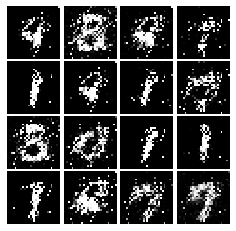

Epoch: 3, Iter: 1420, D: 0.1733, G:0.2934


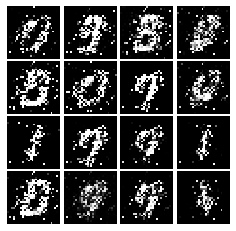

Epoch: 3, Iter: 1440, D: 0.1381, G:0.3171


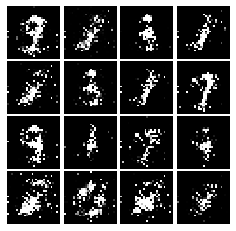

Epoch: 3, Iter: 1460, D: 0.1762, G:0.3613


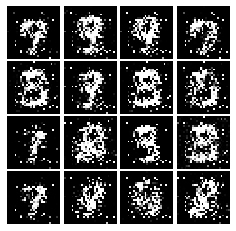

Epoch: 3, Iter: 1480, D: 0.1565, G:0.4293


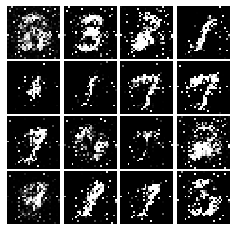

Epoch: 3, Iter: 1500, D: 0.1469, G:0.2832


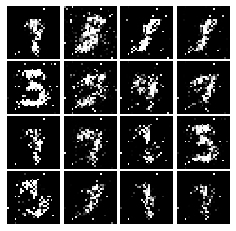

Epoch: 3, Iter: 1520, D: 0.1318, G:0.3484


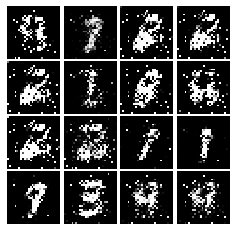

Epoch: 3, Iter: 1540, D: 0.1527, G:0.3267


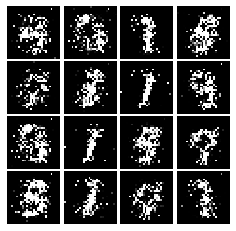

Epoch: 3, Iter: 1560, D: 0.1121, G:0.3512


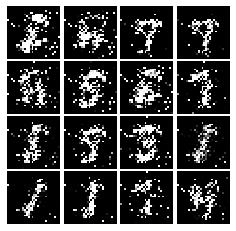

Epoch: 3, Iter: 1580, D: 0.1464, G:0.3088


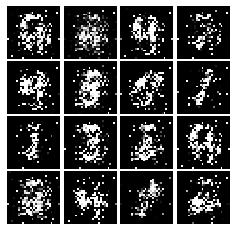

Epoch: 3, Iter: 1600, D: 0.1466, G:0.3595


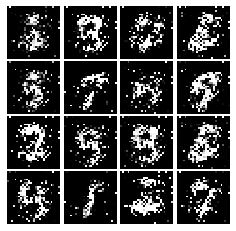

Epoch: 3, Iter: 1620, D: 0.1933, G:0.2297


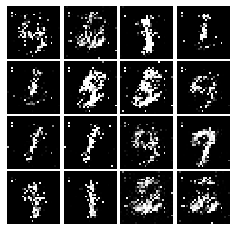

Epoch: 3, Iter: 1640, D: 0.1862, G:0.2498


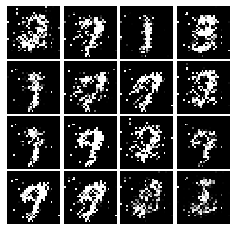

Epoch: 3, Iter: 1660, D: 0.2773, G:0.3511


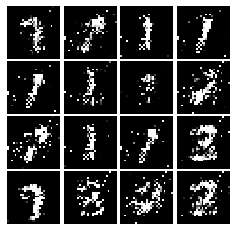

Epoch: 3, Iter: 1680, D: 0.1608, G:0.2484


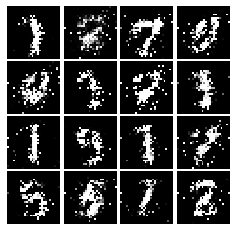

Epoch: 3, Iter: 1700, D: 0.1565, G:0.239


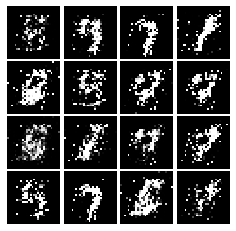

Epoch: 3, Iter: 1720, D: 0.2357, G:0.1396


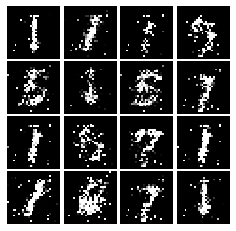

Epoch: 3, Iter: 1740, D: 0.2054, G:0.2665


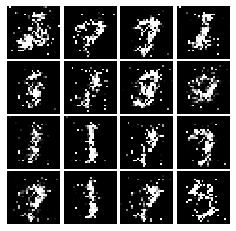

Epoch: 3, Iter: 1760, D: 0.1479, G:0.252


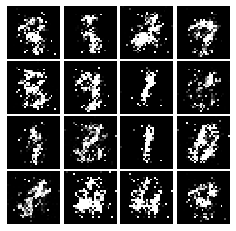

Epoch: 3, Iter: 1780, D: 0.1323, G:0.3139


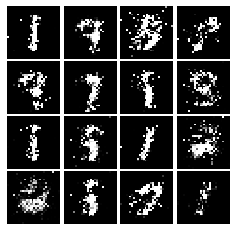

Epoch: 3, Iter: 1800, D: 0.2463, G:0.05764


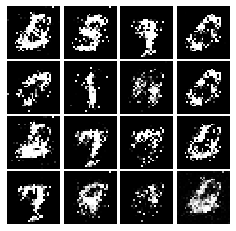

Epoch: 3, Iter: 1820, D: 0.1922, G:0.2513


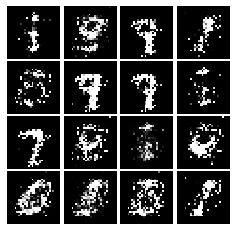

Epoch: 3, Iter: 1840, D: 0.4965, G:0.4082


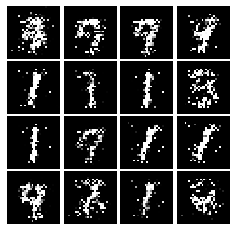

Epoch: 3, Iter: 1860, D: 0.1717, G:0.3234


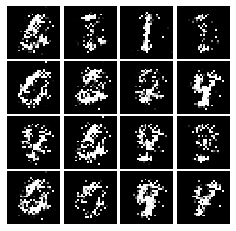

Epoch: 4, Iter: 1880, D: 0.1706, G:0.2998


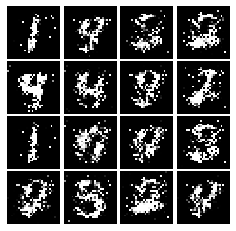

Epoch: 4, Iter: 1900, D: 0.1738, G:0.2832


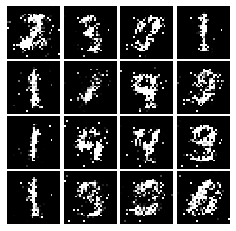

Epoch: 4, Iter: 1920, D: 0.1516, G:0.2669


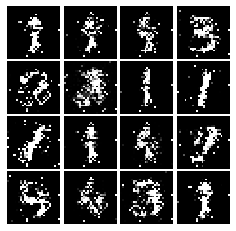

Epoch: 4, Iter: 1940, D: 0.1658, G:0.06237


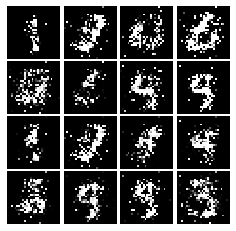

Epoch: 4, Iter: 1960, D: 0.3542, G:0.2838


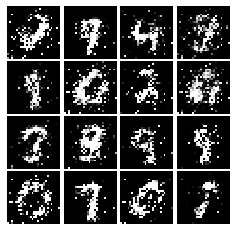

Epoch: 4, Iter: 1980, D: 0.1884, G:0.3083


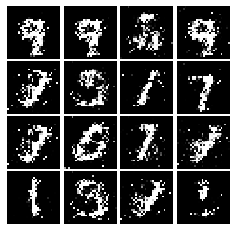

Epoch: 4, Iter: 2000, D: 0.2021, G:0.2176


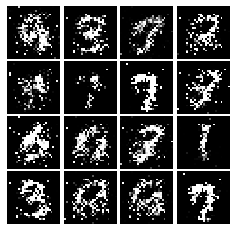

Epoch: 4, Iter: 2020, D: 0.1871, G:0.2438


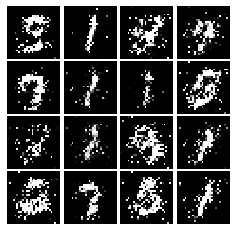

Epoch: 4, Iter: 2040, D: 0.1919, G:0.2307


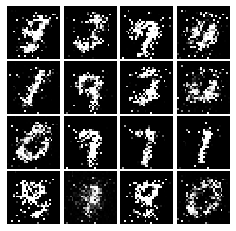

Epoch: 4, Iter: 2060, D: 0.1825, G:0.2139


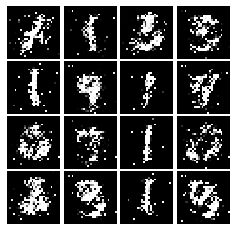

Epoch: 4, Iter: 2080, D: 0.1849, G:0.2063


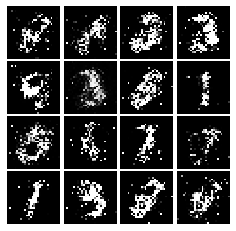

Epoch: 4, Iter: 2100, D: 0.1759, G:0.2646


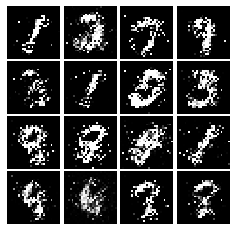

Epoch: 4, Iter: 2120, D: 0.204, G:0.2067


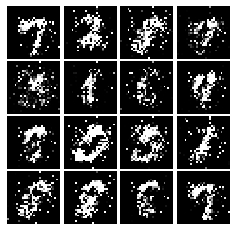

Epoch: 4, Iter: 2140, D: 0.211, G:0.1974


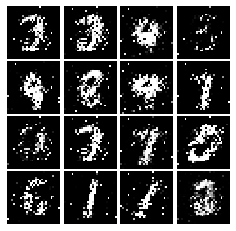

Epoch: 4, Iter: 2160, D: 0.2168, G:0.2119


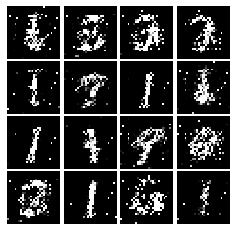

Epoch: 4, Iter: 2180, D: 0.1852, G:0.2155


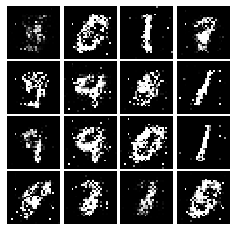

Epoch: 4, Iter: 2200, D: 0.1903, G:0.2303


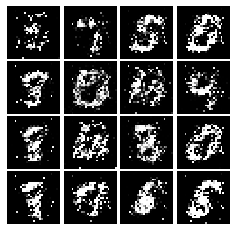

Epoch: 4, Iter: 2220, D: 0.2163, G:0.2105


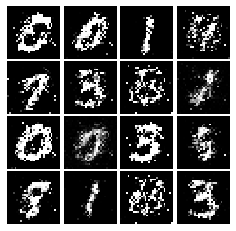

Epoch: 4, Iter: 2240, D: 0.1989, G:0.1946


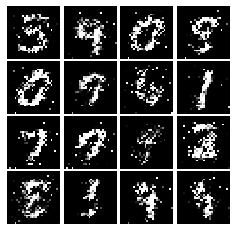

Epoch: 4, Iter: 2260, D: 0.2083, G:0.2266


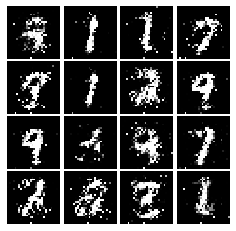

Epoch: 4, Iter: 2280, D: 0.2147, G:0.2023


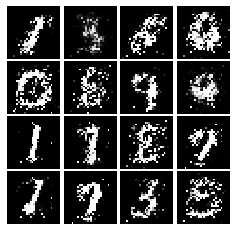

Epoch: 4, Iter: 2300, D: 0.2057, G:0.2004


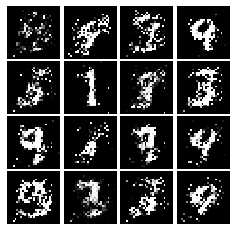

Epoch: 4, Iter: 2320, D: 0.2062, G:0.2472


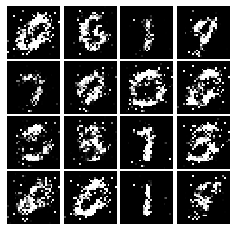

Epoch: 4, Iter: 2340, D: 0.2184, G:0.2236


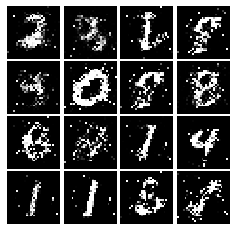

Epoch: 5, Iter: 2360, D: 0.1973, G:0.4453


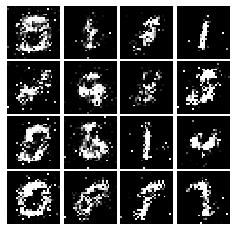

Epoch: 5, Iter: 2380, D: 0.202, G:0.1908


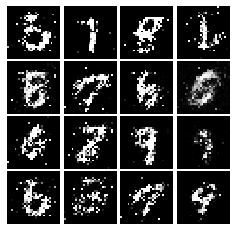

Epoch: 5, Iter: 2400, D: 0.2016, G:0.2474


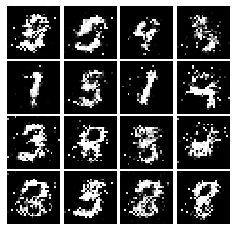

Epoch: 5, Iter: 2420, D: 0.2544, G:0.2608


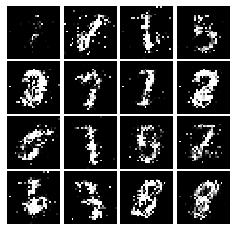

Epoch: 5, Iter: 2440, D: 0.2343, G:0.1812


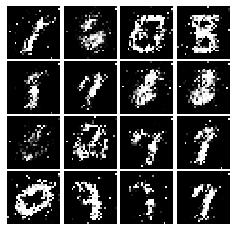

Epoch: 5, Iter: 2460, D: 0.2073, G:0.2085


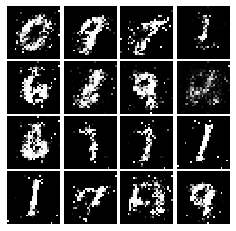

Epoch: 5, Iter: 2480, D: 0.2142, G:0.208


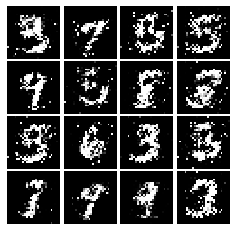

Epoch: 5, Iter: 2500, D: 0.216, G:0.1907


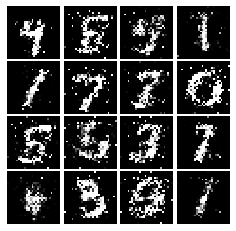

Epoch: 5, Iter: 2520, D: 0.2269, G:0.183


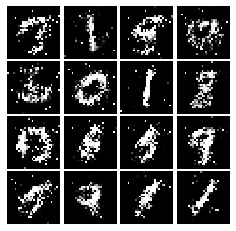

Epoch: 5, Iter: 2540, D: 0.2147, G:0.1905


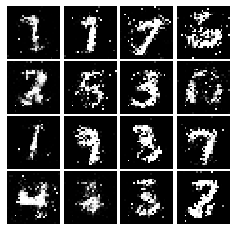

Epoch: 5, Iter: 2560, D: 0.2244, G:0.1694


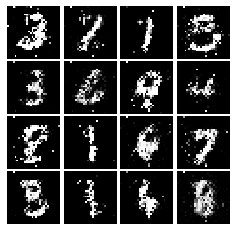

Epoch: 5, Iter: 2580, D: 0.2321, G:0.1867


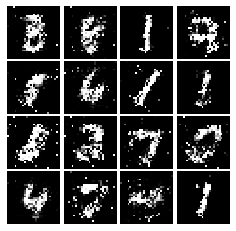

Epoch: 5, Iter: 2600, D: 0.2264, G:0.1686


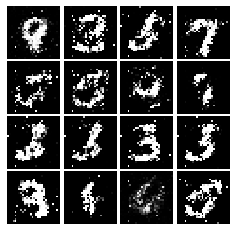

Epoch: 5, Iter: 2620, D: 0.2145, G:0.1711


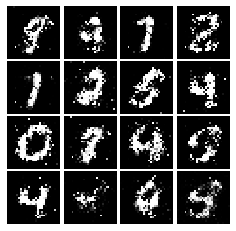

Epoch: 5, Iter: 2640, D: 0.2118, G:0.1888


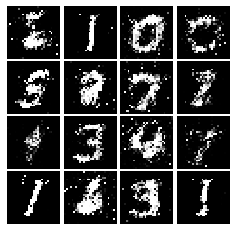

Epoch: 5, Iter: 2660, D: 0.1966, G:0.1765


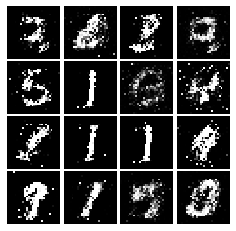

Epoch: 5, Iter: 2680, D: 0.2265, G:0.1966


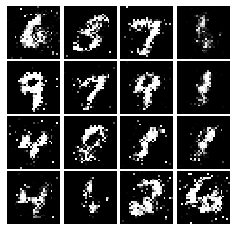

Epoch: 5, Iter: 2700, D: 0.2326, G:0.183


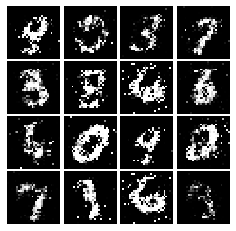

Epoch: 5, Iter: 2720, D: 0.2214, G:0.1653


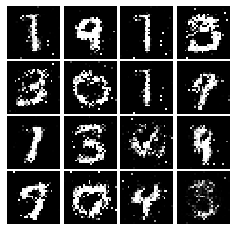

Epoch: 5, Iter: 2740, D: 0.2271, G:0.2012


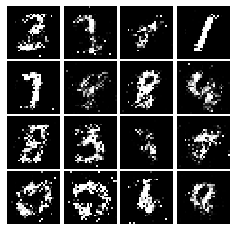

Epoch: 5, Iter: 2760, D: 0.2177, G:0.1814


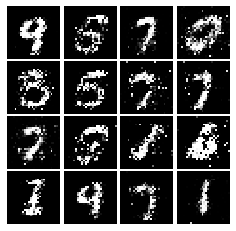

Epoch: 5, Iter: 2780, D: 0.1887, G:0.1889


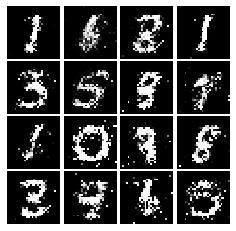

Epoch: 5, Iter: 2800, D: 0.2083, G:0.1872


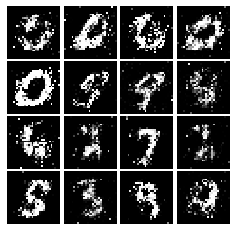

Epoch: 6, Iter: 2820, D: 0.2379, G:0.1971


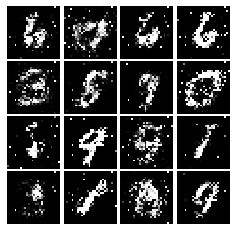

Epoch: 6, Iter: 2840, D: 0.2274, G:0.1846


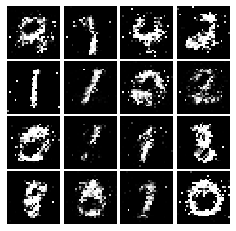

Epoch: 6, Iter: 2860, D: 0.1933, G:0.1802


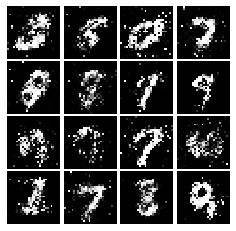

Epoch: 6, Iter: 2880, D: 0.214, G:0.201


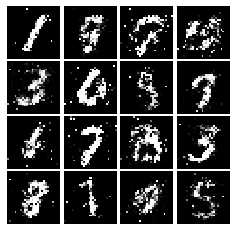

Epoch: 6, Iter: 2900, D: 0.2229, G:0.2113


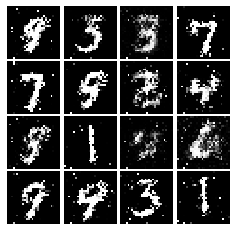

Epoch: 6, Iter: 2920, D: 0.2167, G:0.2118


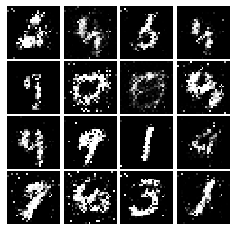

Epoch: 6, Iter: 2940, D: 0.2241, G:0.1956


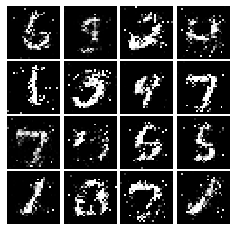

Epoch: 6, Iter: 2960, D: 0.2447, G:0.1593


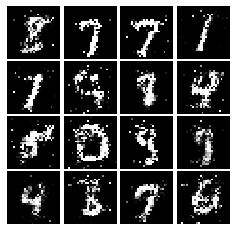

Epoch: 6, Iter: 2980, D: 0.2221, G:0.1643


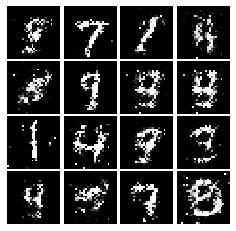

Epoch: 6, Iter: 3000, D: 0.2353, G:0.1678


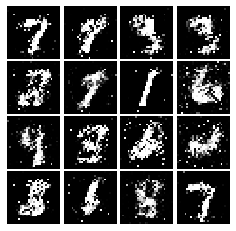

Epoch: 6, Iter: 3020, D: 0.225, G:0.1826


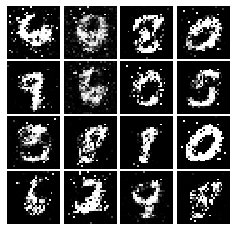

Epoch: 6, Iter: 3040, D: 0.2429, G:0.2104


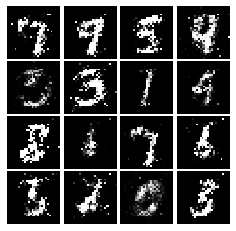

Epoch: 6, Iter: 3060, D: 0.227, G:0.1779


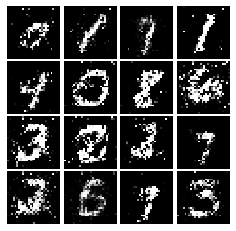

Epoch: 6, Iter: 3080, D: 0.2091, G:0.2155


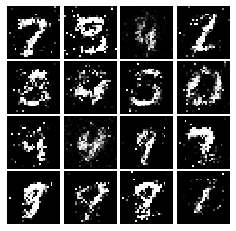

Epoch: 6, Iter: 3100, D: 0.1994, G:0.1998


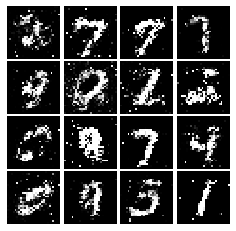

Epoch: 6, Iter: 3120, D: 0.2416, G:0.1553


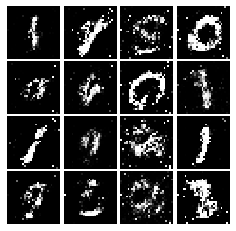

Epoch: 6, Iter: 3140, D: 0.2532, G:0.1766


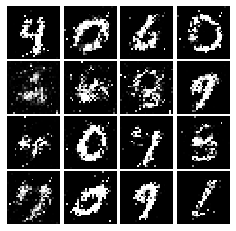

Epoch: 6, Iter: 3160, D: 0.2361, G:0.1866


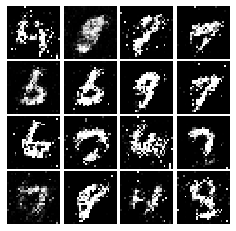

Epoch: 6, Iter: 3180, D: 0.2272, G:0.1689


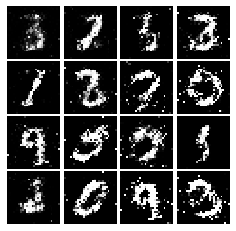

Epoch: 6, Iter: 3200, D: 0.2435, G:0.1673


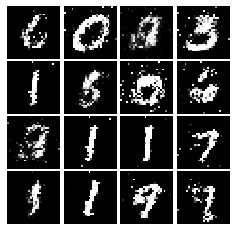

Epoch: 6, Iter: 3220, D: 0.2482, G:0.1914


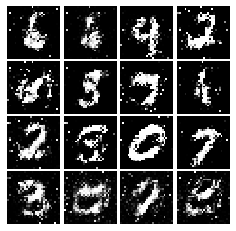

Epoch: 6, Iter: 3240, D: 0.2325, G:0.1797


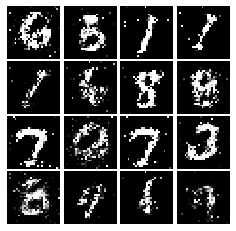

Epoch: 6, Iter: 3260, D: 0.2489, G:0.1888


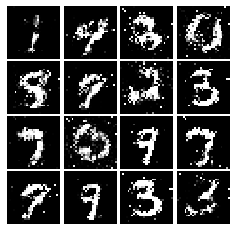

Epoch: 6, Iter: 3280, D: 0.2238, G:0.1754


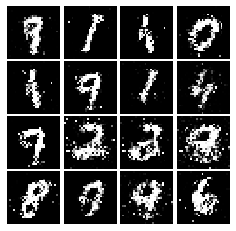

Epoch: 7, Iter: 3300, D: 0.2207, G:0.1764


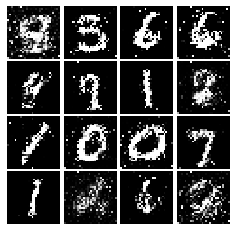

Epoch: 7, Iter: 3320, D: 0.2152, G:0.1878


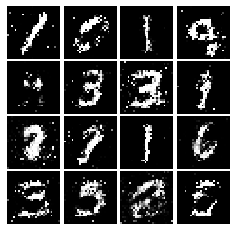

Epoch: 7, Iter: 3340, D: 0.2128, G:0.1778


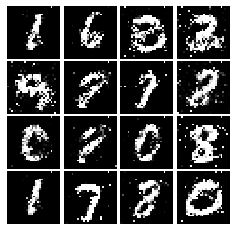

Epoch: 7, Iter: 3360, D: 0.2391, G:0.1637


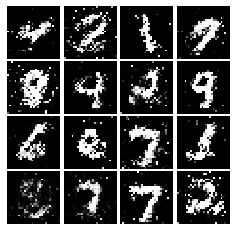

Epoch: 7, Iter: 3380, D: 0.2247, G:0.1777


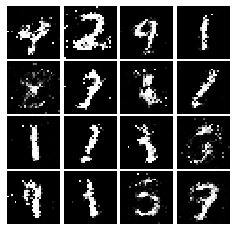

Epoch: 7, Iter: 3400, D: 0.2447, G:0.1666


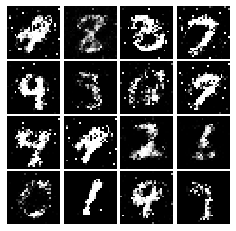

Epoch: 7, Iter: 3420, D: 0.2484, G:0.1668


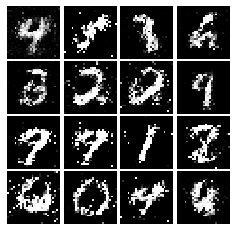

Epoch: 7, Iter: 3440, D: 0.2118, G:0.1885


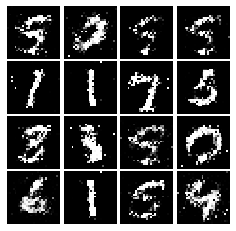

Epoch: 7, Iter: 3460, D: 0.2185, G:0.189


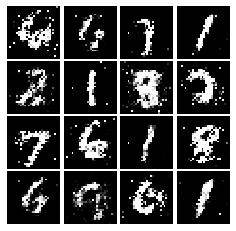

Epoch: 7, Iter: 3480, D: 0.2338, G:0.1834


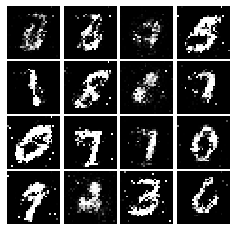

Epoch: 7, Iter: 3500, D: 0.2394, G:0.1563


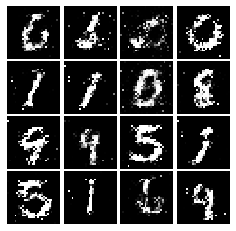

Epoch: 7, Iter: 3520, D: 0.2308, G:0.1592


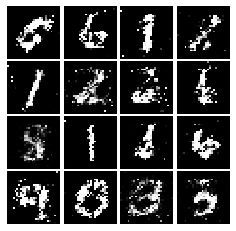

Epoch: 7, Iter: 3540, D: 0.2176, G:0.1924


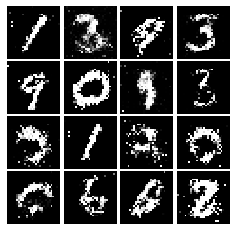

Epoch: 7, Iter: 3560, D: 0.2246, G:0.1978


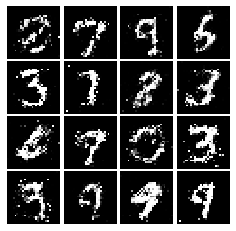

Epoch: 7, Iter: 3580, D: 0.22, G:0.1903


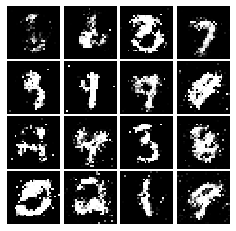

Epoch: 7, Iter: 3600, D: 0.2155, G:0.1722


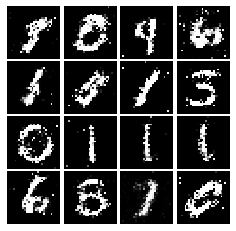

Epoch: 7, Iter: 3620, D: 0.2048, G:0.1964


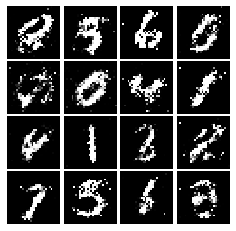

Epoch: 7, Iter: 3640, D: 0.2279, G:0.1879


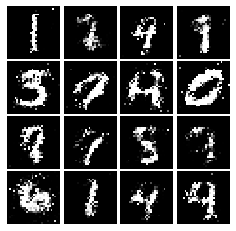

Epoch: 7, Iter: 3660, D: 0.2149, G:0.1538


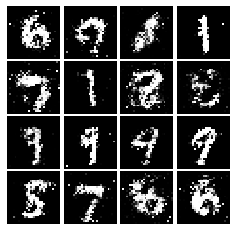

Epoch: 7, Iter: 3680, D: 0.2184, G:0.1789


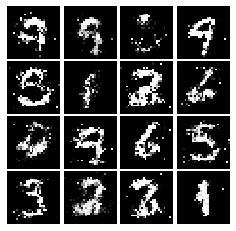

Epoch: 7, Iter: 3700, D: 0.2332, G:0.1796


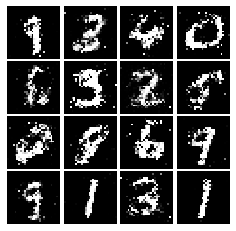

Epoch: 7, Iter: 3720, D: 0.2125, G:0.159


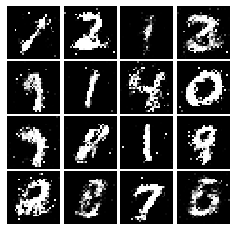

Epoch: 7, Iter: 3740, D: 0.2256, G:0.1334


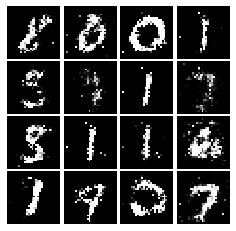

Epoch: 8, Iter: 3760, D: 0.2511, G:0.1576


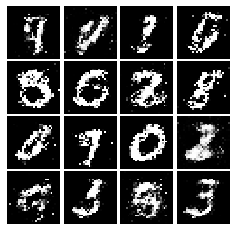

Epoch: 8, Iter: 3780, D: 0.2338, G:0.167


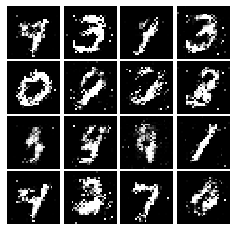

Epoch: 8, Iter: 3800, D: 0.2209, G:0.1978


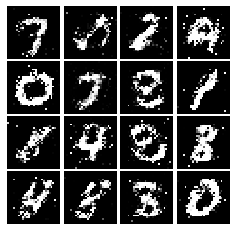

Epoch: 8, Iter: 3820, D: 0.2276, G:0.1687


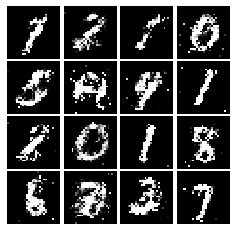

Epoch: 8, Iter: 3840, D: 0.2198, G:0.1848


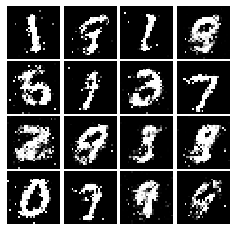

Epoch: 8, Iter: 3860, D: 0.2234, G:0.1676


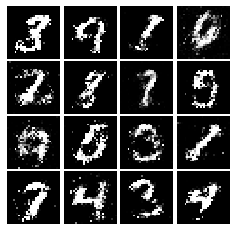

Epoch: 8, Iter: 3880, D: 0.2501, G:0.123


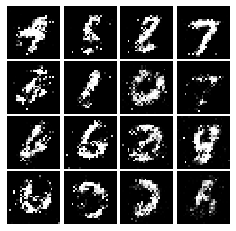

Epoch: 8, Iter: 3900, D: 0.2544, G:0.1521


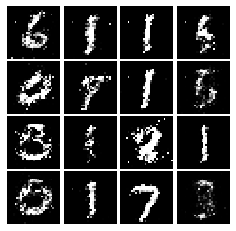

Epoch: 8, Iter: 3920, D: 0.2179, G:0.2018


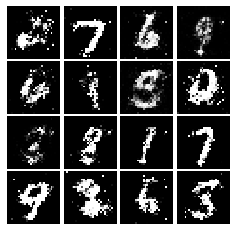

Epoch: 8, Iter: 3940, D: 0.2418, G:0.158


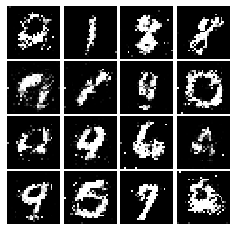

Epoch: 8, Iter: 3960, D: 0.2246, G:0.1854


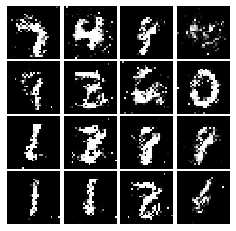

Epoch: 8, Iter: 3980, D: 0.2144, G:0.1917


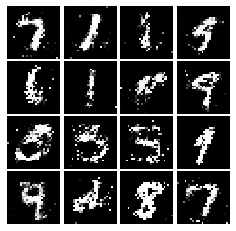

Epoch: 8, Iter: 4000, D: 0.2052, G:0.1692


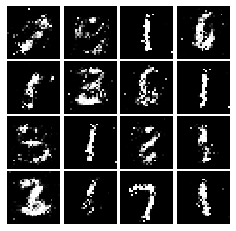

Epoch: 8, Iter: 4020, D: 0.2231, G:0.1547


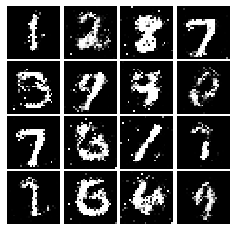

Epoch: 8, Iter: 4040, D: 0.2238, G:0.1881


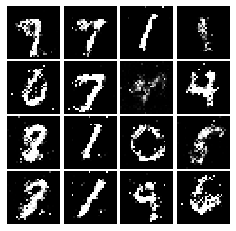

Epoch: 8, Iter: 4060, D: 0.2158, G:0.1674


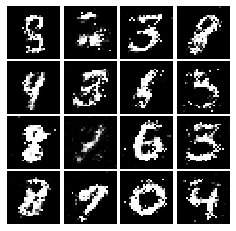

Epoch: 8, Iter: 4080, D: 0.2436, G:0.1642


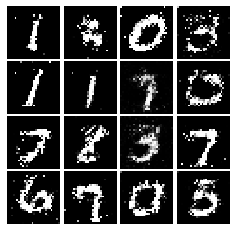

Epoch: 8, Iter: 4100, D: 0.2266, G:0.1757


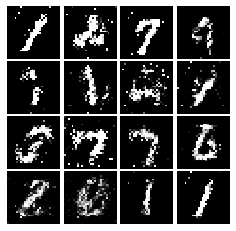

Epoch: 8, Iter: 4120, D: 0.246, G:0.1737


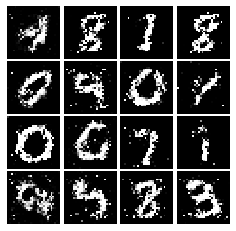

Epoch: 8, Iter: 4140, D: 0.2316, G:0.1879


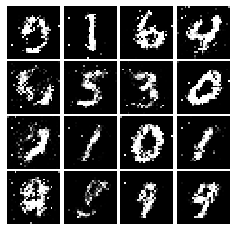

Epoch: 8, Iter: 4160, D: 0.2307, G:0.1645


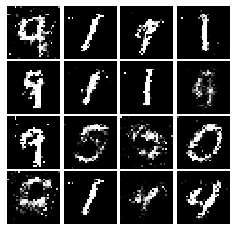

Epoch: 8, Iter: 4180, D: 0.2302, G:0.1474


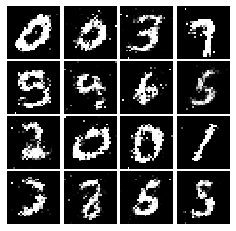

Epoch: 8, Iter: 4200, D: 0.2334, G:0.1888


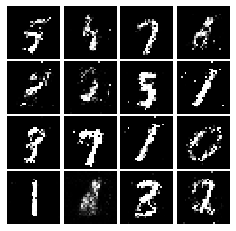

Epoch: 8, Iter: 4220, D: 0.2087, G:0.2046


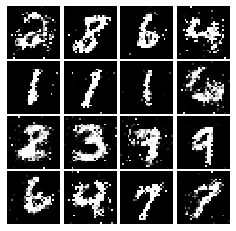

Epoch: 9, Iter: 4240, D: 0.1802, G:0.1996


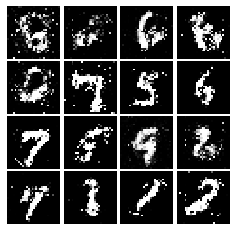

Epoch: 9, Iter: 4260, D: 0.2481, G:0.2036


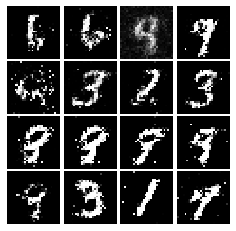

Epoch: 9, Iter: 4280, D: 0.2497, G:0.1885


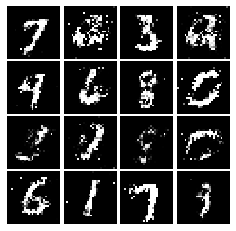

Epoch: 9, Iter: 4300, D: 0.2556, G:0.1606


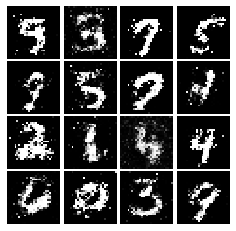

Epoch: 9, Iter: 4320, D: 0.2288, G:0.1679


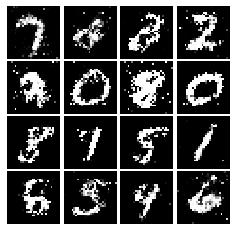

Epoch: 9, Iter: 4340, D: 0.2384, G:0.1762


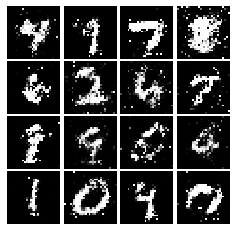

Epoch: 9, Iter: 4360, D: 0.2415, G:0.1593


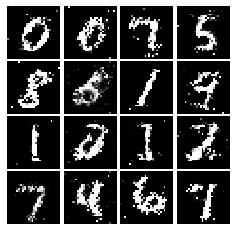

Epoch: 9, Iter: 4380, D: 0.2414, G:0.1542


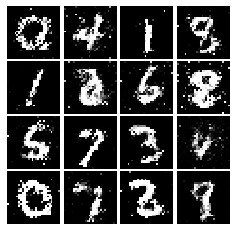

Epoch: 9, Iter: 4400, D: 0.2253, G:0.2071


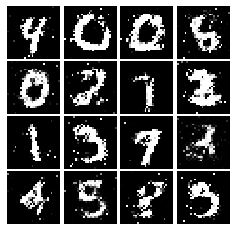

Epoch: 9, Iter: 4420, D: 0.2021, G:0.1723


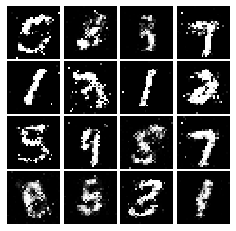

Epoch: 9, Iter: 4440, D: 0.2419, G:0.144


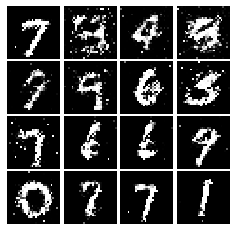

Epoch: 9, Iter: 4460, D: 0.2222, G:0.1776


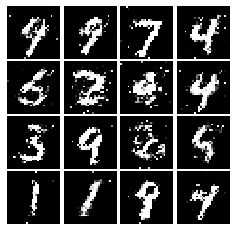

Epoch: 9, Iter: 4480, D: 0.2547, G:0.1699


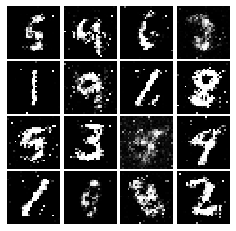

Epoch: 9, Iter: 4500, D: 0.244, G:0.1766


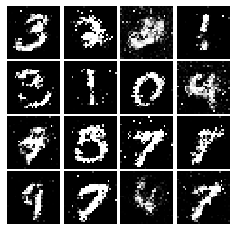

Epoch: 9, Iter: 4520, D: 0.2408, G:0.1506


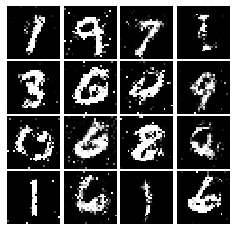

Epoch: 9, Iter: 4540, D: 0.2396, G:0.1471


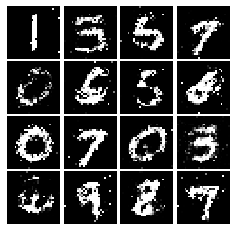

Epoch: 9, Iter: 4560, D: 0.2226, G:0.1659


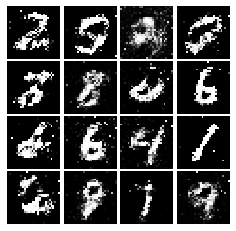

Epoch: 9, Iter: 4580, D: 0.2301, G:0.1561


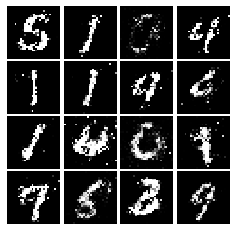

Epoch: 9, Iter: 4600, D: 0.2467, G:0.1639


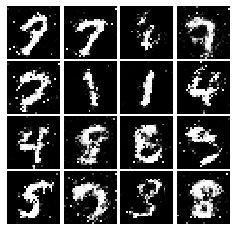

Epoch: 9, Iter: 4620, D: 0.2404, G:0.1733


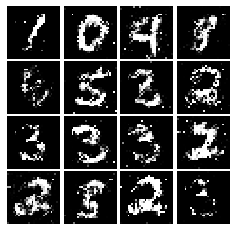

Epoch: 9, Iter: 4640, D: 0.2548, G:0.1667


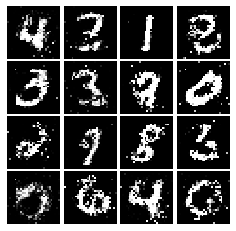

Epoch: 9, Iter: 4660, D: 0.2305, G:0.143


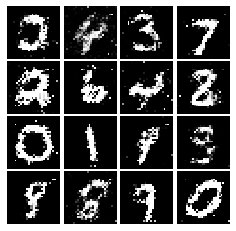

Epoch: 9, Iter: 4680, D: 0.2492, G:0.1495


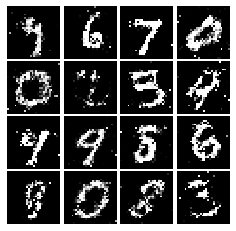

Final images


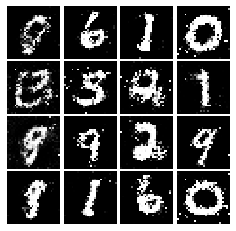

In [56]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [60]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [61]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024,activation = 'relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128,activation = 'relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
        
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

SyntaxError: invalid syntax (<ipython-input-61-6bcdd639c87f>, line 25)

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
